# Analysing behaviour via tracked `trx.mat` data
Sharbat (on 2025-04-23) has decided to split up the Jupyter Notebook dealing with both Chore and `trx.mat` file processing into two notebooks.

This notebook deals with analysing and plotting the information read from the `trx.mat` files.


In [2]:
import os
import sys
import src.data_loader as data_loader
import src.processor as processor
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('../anemotaxis.mplstyle')
%matplotlib widget
%load_ext autoreload
%autoreload 2

# Paths
Locate and load behavioural paths

In [7]:
# base_path_control = "/Users/sharbat/Desktop/Sharbat_DAN_data_June2025/FCF_attP2-40@UAS_TNT_2_0003" #june 2025 data new
# base_path_control = "/Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
base_path_control = "/Volumes/Sharbat'sDrive4TB/T2_Ladder_Neuron_Data/Anemotaxis/FCF_attP2-40@UAS_TNT_2_0003_p_3gradient1/p_3gradient1_2s1x600s0s#n#n#n" #june 2025 data new
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Desktop/Sharbat_DAN_data_June2025/GMR_00864@UAS_TNT_2_0003"
base_path = "/Volumes/Sharbat'sDrive4TB/T2_Ladder_Neuron_Data/Anemotaxis/GMR_SS01632@UAS_TNT_2_0003_p_3gradient1/p_3gradient1_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"

# control
# trx_path = os.path.join(base_path_control, "20240219_143334/trx.mat")
# trx_path = os.path.join(base_path_control, "20240223_112627/trx.mat")
# trx_path = os.path.join(base_path_control, "20240301_105819/trx.mat")
# trx_path = os.path.join(base_path_control, "20240301_121446/trx.mat")
# trx_path = os.path.join(base_path_control, "20240304_151714/trx.mat")
# trx_path = os.path.join(base_path_control, "20240308_104430/trx.mat")
# trx_path = os.path.join(base_path_control, "20240308_124423/trx.mat")
# trx_path = os.path.join(base_path_control, "20240304_162010/trx.mat")
trx_path = os.path.join(base_path_control, "20250620_151906/trx.mat")

# SS01757
# trx_path = os.path.join(base_path_control,20240219_145347/trx.mat")
# trx_path = os.path.join(base_path_control,20240308_121454/trx.mat") 
# trx_path = os.path.join(base_path_control,20240223_120812/trx.mat") 
# trx_path = os.path.join(base_path_control,20240226_165304/trx.mat") 
# trx_path = os.path.join(base_path_control,20240301_104205/trx.mat") 
# trx_path = os.path.join(base_path_control,20240304_150157/trx.mat")

# SS01948
# trx_path = os.path.join(base_path_control,20240308_115957/trx.mat")
# trx_path = os.path.join(base_path_control,20240219_140808/trx.mat")
# trx_path = os.path.join(base_path_control,20240223_110610/trx.mat") 
# trx_path = os.path.join(base_path_control,20240226_160620/trx.mat") 
# trx_path = os.path.join(base_path_control,20240301_114359/trx.mat") 
# trx_path = os.path.join(base_path_control,20240304_153212/trx.mat")
# SS01696
# trx_path = os.path.join(base_path_control,20240219_155844/trx.mat") 
# trx_path = os.path.join(base_path_control,20240308_125815/trx.mat") 
# trx_path = os.path.join(base_path_control,20240223_115010/trx.mat") 
# trx_path = os.path.join(base_path_control,20240226_170838/trx.mat") 
# trx_path = os.path.join(base_path_control,20240301_111323/trx.mat") 
# trx_path = os.path.join(base_path_control,20240304_141357/trx.mat")
# MB143B
# trx_path = os.path.join(base_path_control,20240226_152833/trx.mat") 
# trx_path = os.path.join(base_path_control,20240308_131239/trx.mat") 
# trx_path = os.path.join(base_path_control,20240304_143024/trx.mat") 
# trx_path = os.path.join(base_path_control,20240301_112859/trx.mat")

### Single `trx.mat` file
This one loads a single `trx.mat` file from a single date of a single genotype for sanity checks

In [8]:
# Process a single trx.mat file
date_str, extracted_data, metadata = data_loader.process_single_file(trx_path)

# print(f"\nProcessed file metadata:")
print(f"Date: {metadata['date']}")
print(f"Number of larvae: {metadata['n_larvae']}")

Date: 2025-06-20 00:00:00
Number of larvae: 57


### All `trx.mat` file
This one loads all `trx.mat` files of both control genotype and experimental genotype

In [9]:
# Process all trx files in a directory tree
all_data_control = data_loader.process_all_trx_files(base_path_control)
all_data = data_loader.process_all_trx_files(base_path)

print(f"\nProcessed all files:")
print(f"Total experiments: {len(all_data['metadata']['experiments'])}")
print(f"Total larvae: {all_data['metadata']['total_larvae']}")  # Remove len() as total_larvae is already an integer

Found 3 trx.mat files


Processing trx files:   0%|          | 0/3 [00:00<?, ?it/s]


Processed 3 files
Total larvae: 181
Found 3 trx.mat files


Processing trx files:   0%|          | 0/3 [00:00<?, ?it/s]


Processed 3 files
Total larvae: 170

Processed all files:
Total experiments: 3
Total larvae: 170


# Filter and Merge
Filter by duration, remove small tracked paths. Also implement a logic of - if a stop is below mean or 2 seconds, and between two casts, we merge the three things - the two casts and one stop in between as as one cast*

In [10]:
filtered_extracted_data = processor.filter_larvae_by_duration(extracted_data, min_total_duration=60)
filtered_extracted_data, stop_time_stats = processor.filter_larvae_by_excess_stop_time(
    filtered_extracted_data,
    max_stop_percentage=0.4  # Remove larvae where >50% of time is in stop state
)

# For filtered_extracted_data
behavior_stats = processor.plot_behavior_duration_histograms(filtered_extracted_data, 
                                                          show_plot=False, 
                                                          using_frames=False)

merged_data, merge_summary = processor.merge_short_stop_sequences(
    filtered_extracted_data, 
    behavior_stats,
    min_stop_duration_cast=3.0,  
    min_stop_duration_run=3.0  
)

Excess stop time filtering results (threshold: 40%):
  - Removed 1 larvae with >40% time in stop state
  - 46 larvae remaining

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 46
Total actions: 670

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      318   47.5%      1.01       0.61       3.45        94        159
        cast:      259   38.7%      0.79       0.46       0.84        83        129
        stop:       41    6.1%      0.35       0.35       0.08        19         20
       hunch:       17    2.5%      0.34       0.33       0.23         8          8
      backup:       32    4.8%      0.51       0.42       0.34        11         16
        roll:        3    0.4%      0.51       0.36       0.23         1          1

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number 

Excess stop time filtering results (threshold: 40%):
  - Removed 2 larvae with >40% time in stop state
  - 143 larvae remaining
Excess stop time filtering results (threshold: 40%):
  - Removed 5 larvae with >40% time in stop state
  - 116 larvae remaining


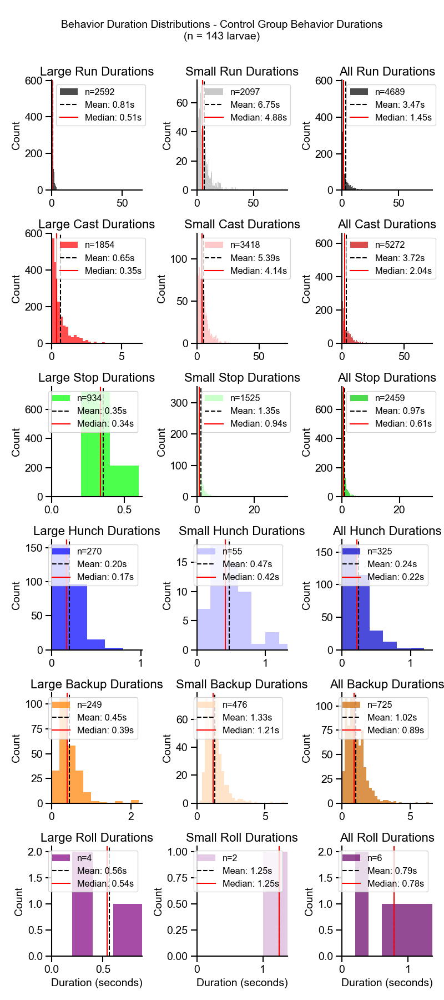


Large Behaviors duration analysis (seconds) for Control Group Behavior Durations
Number of larvae: 143
Total actions: 5903

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:     2592   43.9%      0.81       0.51       1.43       881       1296
        cast:     1854   31.4%      0.65       0.35       0.79       584        927
        stop:      934   15.8%      0.35       0.34       0.07       401        467
       hunch:      270    4.6%      0.20       0.17       0.13       117        133
      backup:      249    4.2%      0.45       0.39       0.30        93        123
        roll:        4    0.1%      0.56       0.54       0.22         2          2

Small Behaviors duration analysis (seconds) for Control Group Behavior Durations
Number of larvae: 143
Total actions: 7573

    Behavior   Events  %Total       Mean     Median        Std Ab

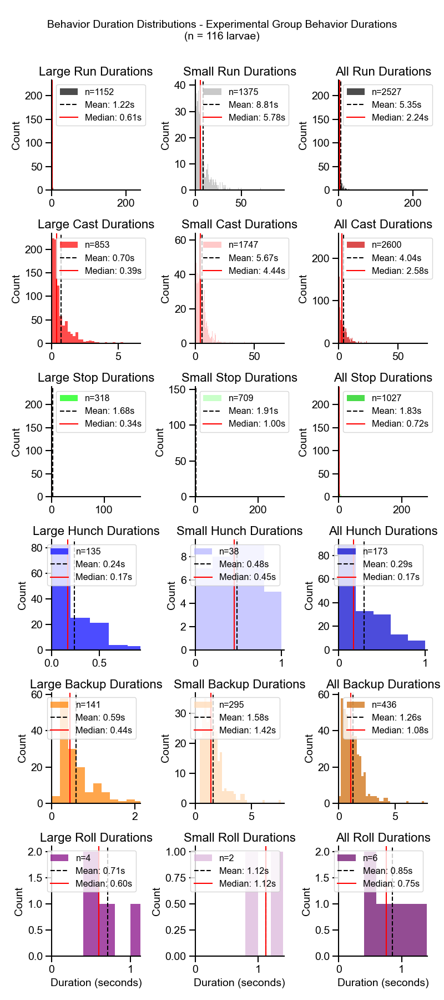


Large Behaviors duration analysis (seconds) for Experimental Group Behavior Durations
Number of larvae: 116
Total actions: 2603

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:     1152   44.3%      1.22       0.61       7.20       305        576
        cast:      853   32.8%      0.70       0.39       0.87       249        425
        stop:      318   12.2%      1.68       0.34      12.41         4        158
       hunch:      135    5.2%      0.24       0.17       0.19        42         67
      backup:      141    5.4%      0.59       0.44       0.39        52         70
        roll:        4    0.2%      0.71       0.60       0.21         1          2

Small Behaviors duration analysis (seconds) for Experimental Group Behavior Durations
Number of larvae: 116
Total actions: 4166

    Behavior   Events  %Total       Mean     Median    

In [11]:
# Filter using percentile threshold (bottom 10% removed) or min duration
filtered_all_data_control = processor.filter_larvae_by_duration(all_data_control, min_total_duration=60)
filtered_all_data = processor.filter_larvae_by_duration(all_data, min_total_duration=60)



# Also filter control and experimental datasets
filtered_all_data_control, control_stop_stats = processor.filter_larvae_by_excess_stop_time(
    filtered_all_data_control,
    max_stop_percentage=0.4
)

filtered_all_data, exp_stop_stats = processor.filter_larvae_by_excess_stop_time(
    filtered_all_data,
    max_stop_percentage=0.4
)

# Now analyze behavior durations on properly filtered data
# First, let's calculate behavior statistics for each dataset to use in merging


# For filtered_all_data_control
behavior_stats_control = processor.plot_behavior_duration_histograms(filtered_all_data_control, 
                                                            show_plot=True,
                                                            using_frames=False,
                                                            title="Control Group Behavior Durations")

# For filtered_all_data (experimental)
behavior_stats_exp = processor.plot_behavior_duration_histograms(filtered_all_data, 
                                                      show_plot=True,
                                                      using_frames=False,
                                                      title="Experimental Group Behavior Durations")

# Now merge short stops for each dataset

# For filtered_all_data_control
merged_data_control, merge_summary_control = processor.merge_short_stop_sequences(
    filtered_all_data_control, 
    behavior_stats_control,
    min_stop_duration_cast=3.0,  
    min_stop_duration_run=3.0  
)
# print(f"\nControl data merging summary:")
# print(f"  - {merge_summary_control['cast_stop_cast_count']} cast-stop-cast sequences merged")
# print(f"  - {merge_summary_control['run_stop_run_count']} run-stop-run sequences merged")
# print(f"  - {merge_summary_control['mixed_count']} mixed sequences merged")

# For filtered_all_data (experimental)
merged_data_exp, merge_summary_exp = processor.merge_short_stop_sequences(
    filtered_all_data, 
    behavior_stats_exp,
    min_stop_duration_cast=3.0,  
    min_stop_duration_run=3.0  
)
print(f"\nExperimental data merging summary:")
print(f"  - {merge_summary_exp['cast_stop_cast_count']} cast-stop-cast sequences merged")
print(f"  - {merge_summary_exp['run_stop_run_count']} run-stop-run sequences merged")
print(f"  - {merge_summary_exp['mixed_count']} mixed sequences merged")

# Now you have:
# - merged_data (for filtered_extracted_data)
# - merged_data_control (for filtered_all_data_control)
# - merged_data_exp (for filtered_all_data)


# Durations

/Users/sharbat/Projects/anemotaxis/src/processor.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


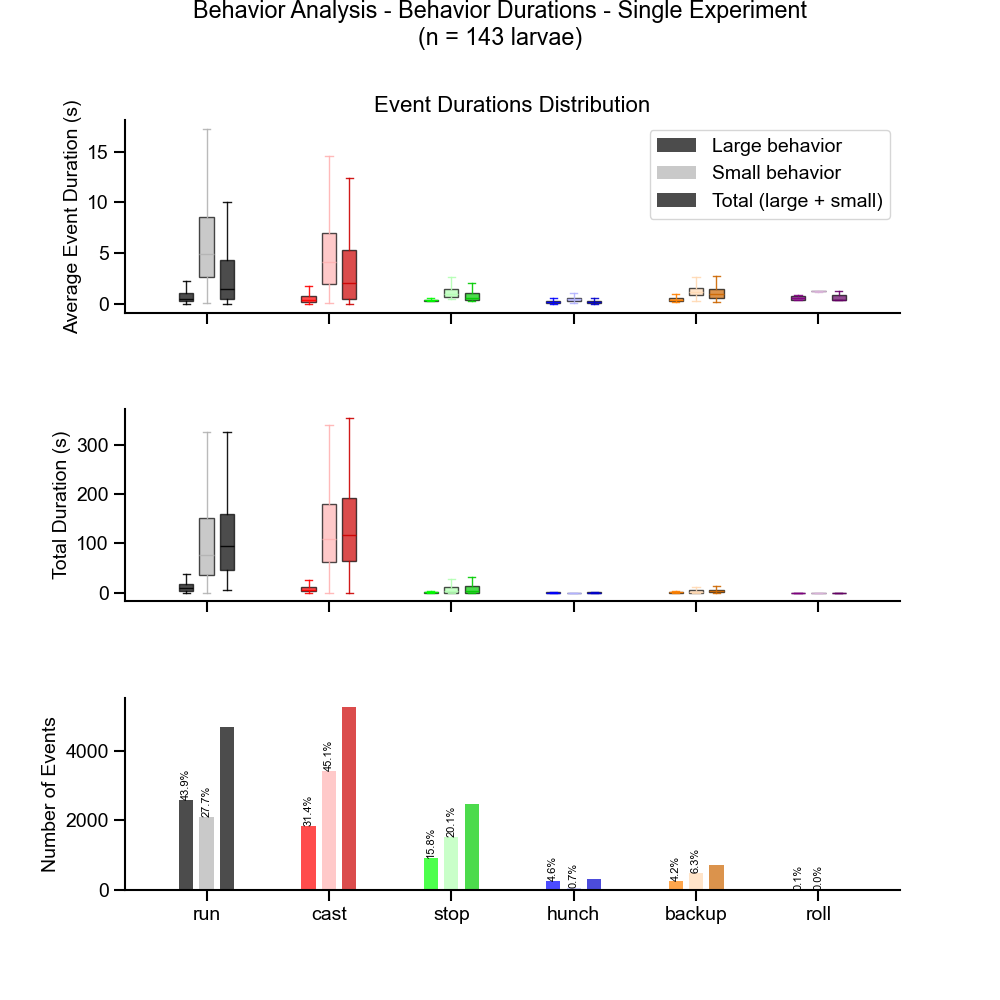


Large Behaviors analysis for Behavior Durations - Single Experiment
Number of larvae: 143
Total actions: 5903

    Behavior   Events  %Total      Mean(s)  Median(s)
------------------------------------------------------------
         run:     2592   43.9%      0.81       0.51
        cast:     1854   31.4%      0.65       0.35
        stop:      934   15.8%      0.35       0.34
       hunch:      270    4.6%      0.20       0.17
      backup:      249    4.2%      0.45       0.39
        roll:        4    0.1%      0.56       0.54

Small Behaviors analysis for Behavior Durations - Single Experiment
Number of larvae: 143
Total actions: 7573

    Behavior   Events  %Total      Mean(s)  Median(s)
------------------------------------------------------------
         run:     2097   27.7%      6.75       4.88
        cast:     3418   45.1%      5.39       4.14
        stop:     1525   20.1%      1.35       0.94
       hunch:       55    0.7%      0.47       0.42
      backup:      476    

In [12]:
# For all experiments
stats = processor.analyze_behavior_durations(filtered_all_data_control, title="Behavior Durations - Single Experiment")

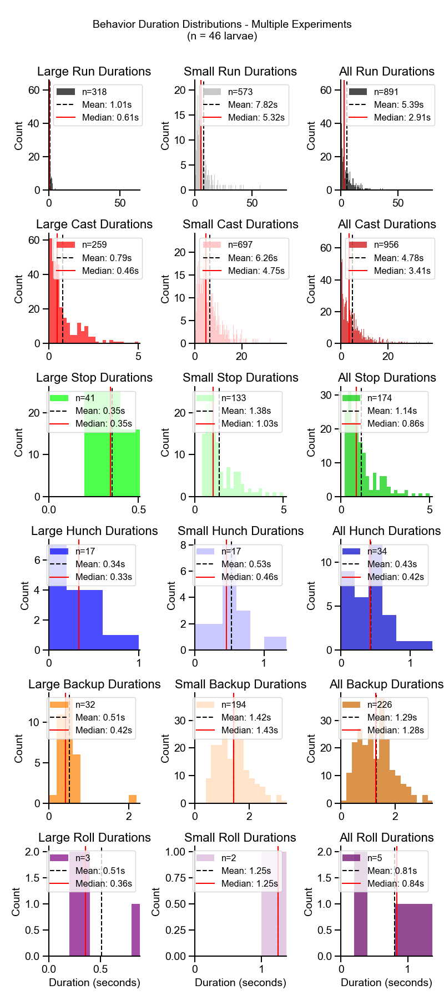


Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 46
Total actions: 670

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      318   47.5%      1.01       0.61       3.45        94        159
        cast:      259   38.7%      0.79       0.46       0.84        83        129
        stop:       41    6.1%      0.35       0.35       0.08        19         20
       hunch:       17    2.5%      0.34       0.33       0.23         8          8
      backup:       32    4.8%      0.51       0.42       0.34        11         16
        roll:        3    0.4%      0.51       0.36       0.23         1          1

Small Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 46
Total actions: 1616

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-------

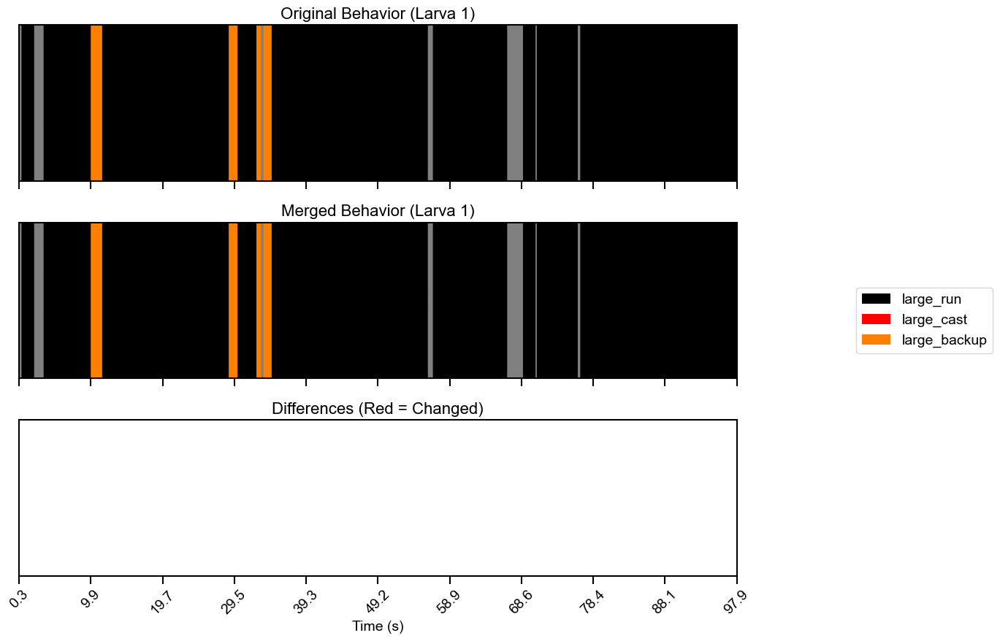

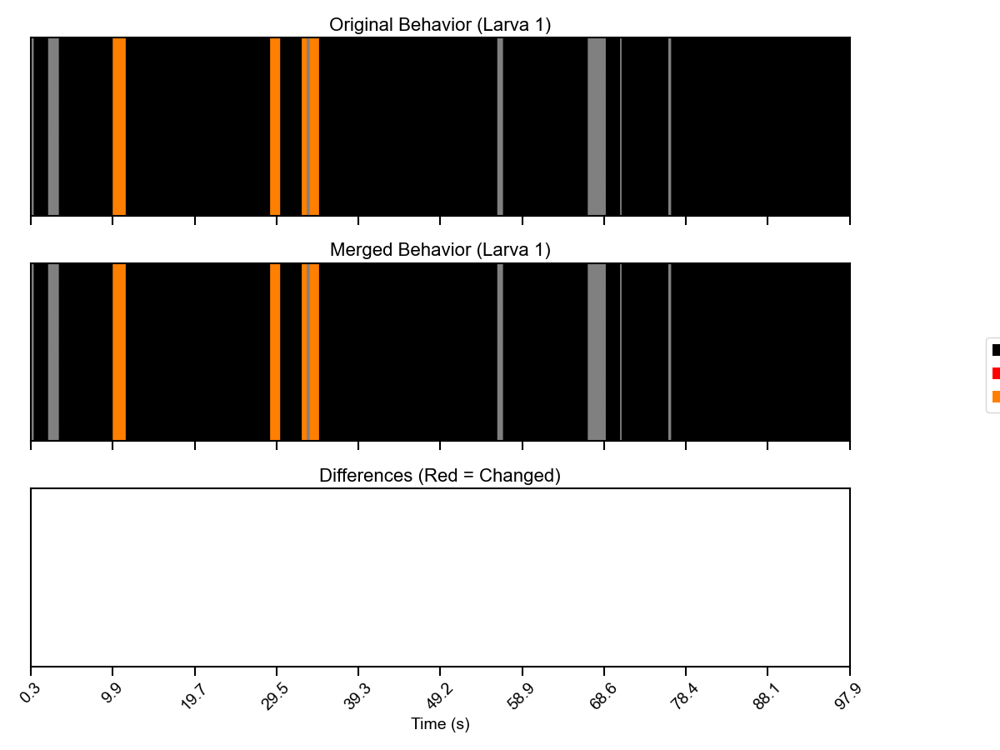

In [13]:
# After analyzing behavior durations
behavior_stats = processor.plot_behavior_duration_histograms(filtered_extracted_data, show_plot=True, using_frames = False, title=None, 
                                     bin_width=None, max_value=None, log_scale=False,
                                     save_path=None)
# Merge short stop sequences
merged_data, merge_summary = processor.merge_short_stop_sequences(
    filtered_extracted_data, 
    behavior_stats,
    min_stop_duration_cast=3.0,  # Minimum for cast-stop-cast (default)
    min_stop_duration_run=3.0    # Minimum for run-stop-run (default)
)

# Visualize the results of merging
processor.plot_behavior_merge_differences(filtered_extracted_data, merged_data)

# Ethogram

Mean duration for large_run: 5.45s
Mean duration for large_cast: 5.04s
Mean duration for large_stop: 1.07s
Mean duration for large_hunch: 0.46s
Mean duration for large_backup: 1.43s
Mean duration for large_roll: 1.25s


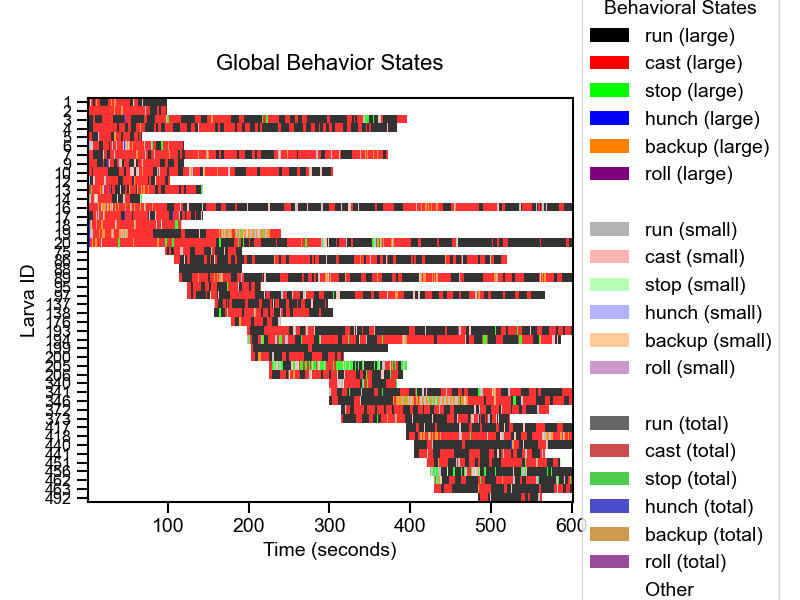

array([[[1. , 0.7, 0.7],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]],

       [[1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]],

       [[0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]],

       ...,

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]]

In [14]:
# Then plot the behavior matrix with only above-mean behaviors
processor.plot_global_behavior_matrix_above_mean(merged_data)

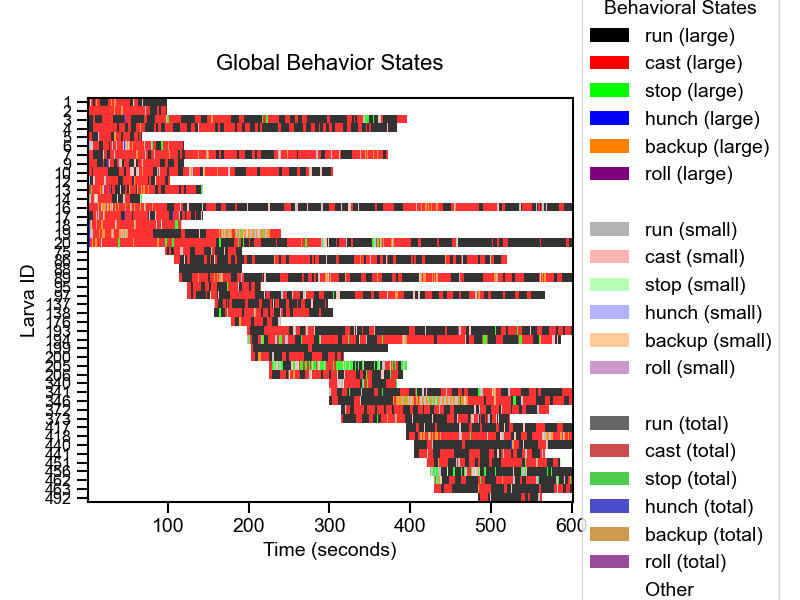

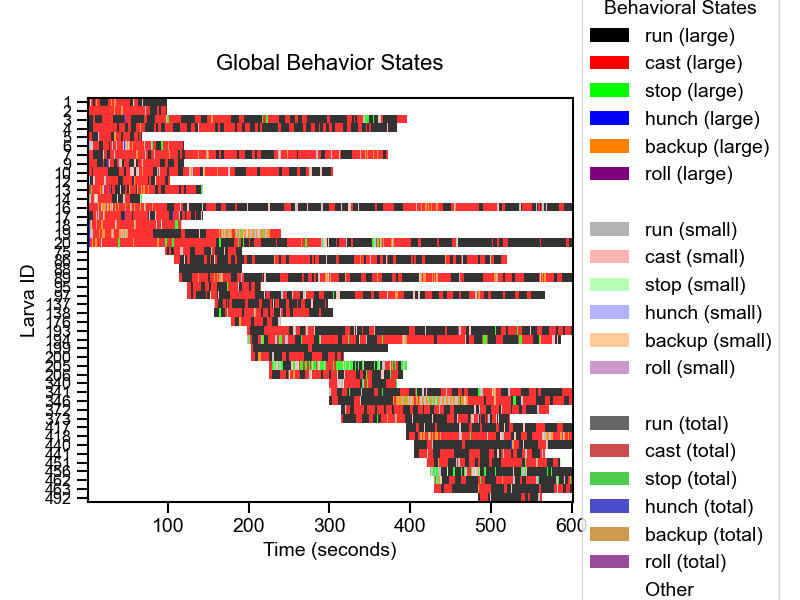

array([[[1. , 0.7, 0.7],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]],

       [[1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]],

       [[0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]],

       ...,

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]]

In [15]:
# Show large, small, and total behavior rows
processor.plot_global_behavior_matrix(filtered_extracted_data, show_separate_totals = False)

# # # # Or to show just one row per larva (original behavior)
processor.plot_global_behavior_matrix(merged_data, show_separate_totals=False)

In [16]:
# For a single larva
first_larva = next(iter(filtered_extracted_data.keys()))
# first_larva = 2

# Count stops before merging
stop_states = [3, 2.5]  # large_stop and small_stop
stop_count_before = sum(np.sum(filtered_extracted_data[first_larva]['global_state_large_state'] == state) 
                        for state in stop_states)
print(f"Stop states before merging: {stop_count_before}")

# Count stops after merging
stop_count_after = sum(np.sum(merged_data[first_larva]['global_state_large_state'] == state) 
                      for state in stop_states)
print(f"Stop states after merging: {stop_count_after}")

Stop states before merging: 0
Stop states after merging: 0



Processing 20250620_151906
  - After duration filtering: 10 larvae
Excess stop time filtering results (threshold: 40%):
  - Removed 0 larvae with >40% time in stop state
  - 10 larvae remaining
  - After stop percentage filtering: 10 larvae

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 10
Total actions: 221

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:       99   44.8%      0.73       0.58       0.58        42         49
        cast:       92   41.6%      0.87       0.53       0.92        26         46
        stop:       12    5.4%      0.35       0.34       0.07         6          6
       hunch:        3    1.4%      0.31       0.33       0.18         2          1
      backup:       14    6.3%      0.43       0.35       0.17         5          7
        roll:        1    0.5%      0.84      

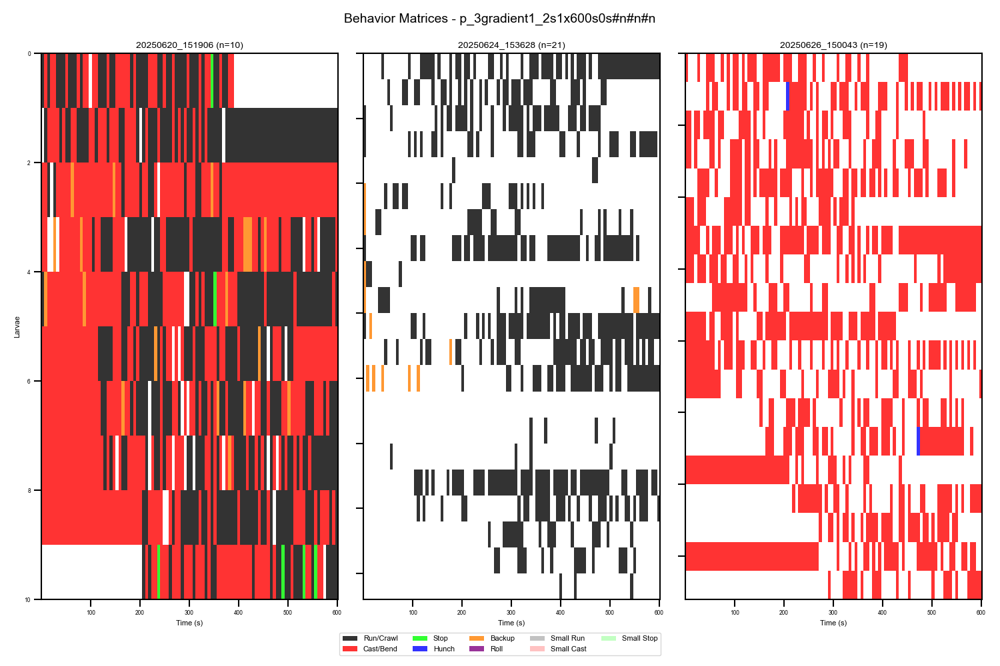


Processing 20250620_153156
  - After duration filtering: 11 larvae
Excess stop time filtering results (threshold: 40%):
  - Removed 2 larvae with >40% time in stop state
  - 9 larvae remaining
  - After stop percentage filtering: 9 larvae

Large Behaviors duration analysis (seconds) for Multiple Experiments
Number of larvae: 9
Total actions: 283

    Behavior   Events  %Total       Mean     Median        Std Above Mean  Above Med
-----------------------------------------------------------------------------------------------
         run:      113   39.9%      3.15       0.94      21.31         9         56
        cast:       99   35.0%      0.79       0.42       0.97        30         49
        stop:       48   17.0%      0.36       0.34       0.08        21         24
       hunch:        1    0.4%      0.34       0.34       0.00         0          0
      backup:       22    7.8%      0.76       0.60       0.46         8         11

Small Behaviors duration analysis (seconds) for 

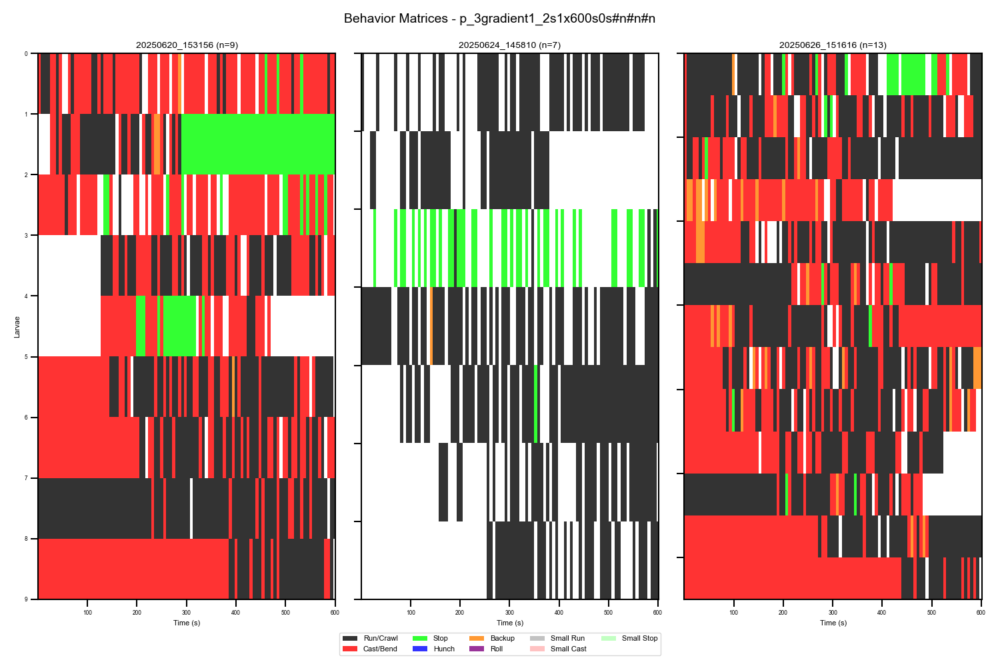

In [17]:
# Process all dates in the control path
all_merged_data_control, fig_control = processor.plot_behavior_matrices_for_all_dates(
    base_path_control,
    show_separate_totals=False,
    min_duration=300,
    max_stop_percentage=0.4,
    min_stop_duration_cast=3.0,
    min_stop_duration_run=3.0,
    save_path="/Users/sharbat/Projects/anemotaxis/results/figures/behavior_matrices_control.png"
)

# Process all dates in the experimental path
all_merged_data_exp, fig_exp = processor.plot_behavior_matrices_for_all_dates(
    base_path,
    show_separate_totals=False,
    min_duration=300,
    max_stop_percentage=0.4,
    min_stop_duration_cast=3.0,
    min_stop_duration_run=3.0,
    save_path="/Users/sharbat/Projects/anemotaxis/results/figures/behavior_matrices_experimental.png"
)

Total time points changed: 0.0 (0.00%)
Cast-stop-cast sequences identified in this view: 0
Total time points changed: 0.0 (nan%)
Cast-stop-cast sequences identified in this view: 0


/Users/sharbat/Projects/anemotaxis/src/processor.py:1372: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax1.imshow(orig_states.reshape(1, -1), aspect='auto', cmap=behavior_cmap)
/Users/sharbat/Projects/anemotaxis/src/processor.py:1377: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax2.imshow(merged_states.reshape(1, -1), aspect='auto', cmap=behavior_cmap)
/Users/sharbat/Projects/anemotaxis/src/processor.py:1383: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax3.imshow(diff_states.reshape(1, -1), aspect='auto', cmap=diff_cmap)
/Users/sharbat/Projects/anemotaxis/src/processor.py:1433: RuntimeWarning: invalid value encountered in scalar divide
  pct_changes = (n_changes / len(diff_states)) * 100


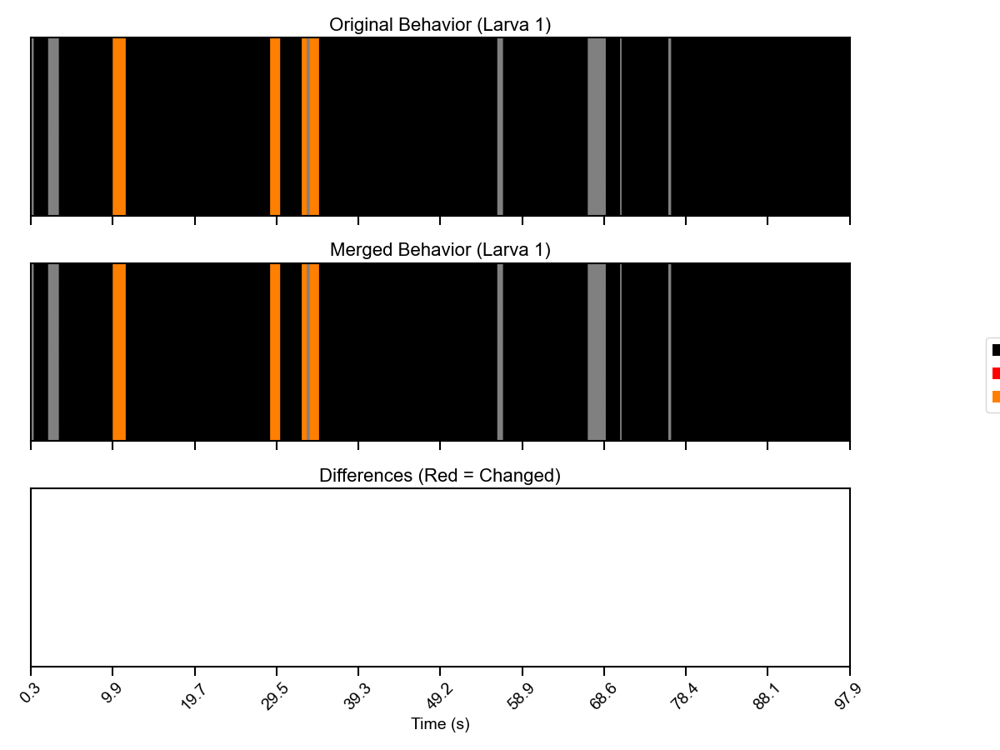

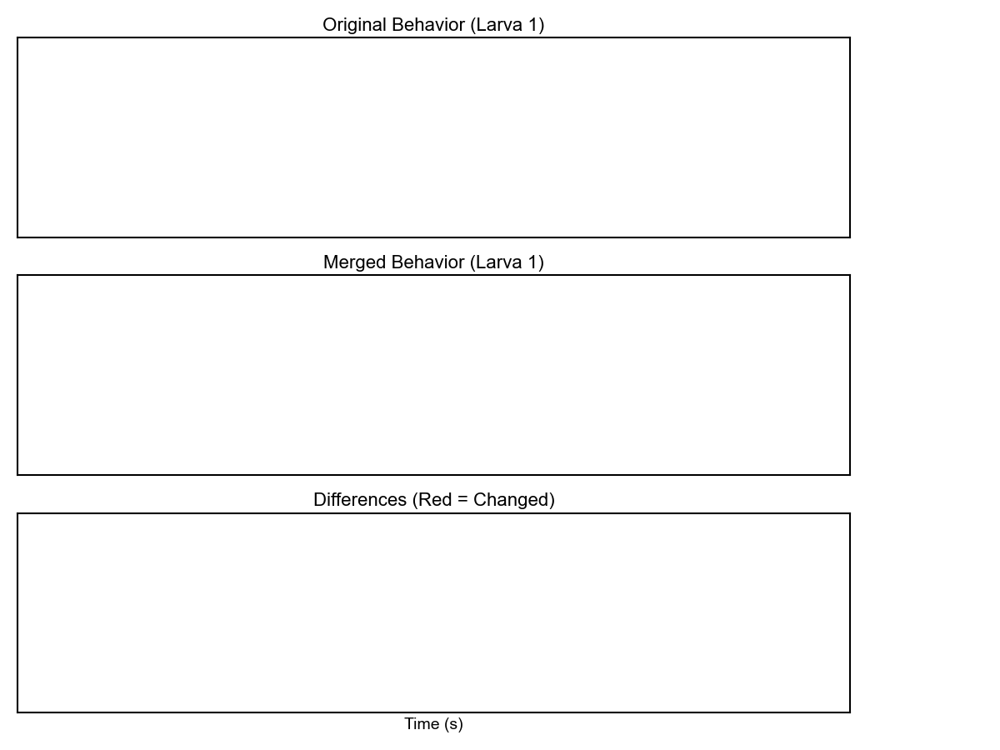

In [18]:
# # Full timeline difference
diff_fig = processor.plot_behavior_merge_differences(
    filtered_extracted_data,
    merged_data,
    larva_id=first_larva
)

# # Or zoom in to see details more clearly
zoomed_diff_fig = processor.plot_behavior_merge_differences(
    filtered_extracted_data,
    merged_data,
    larva_id=first_larva,
    time_window=[280,300]  # Focus on 50 seconds between t=100s and t=150s
)

In [19]:
# # Save video of the first larva's behavior
# first_larva = sorted(filtered_extracted_data.keys())[0]
# trx_processor.save_behavioral_contour_video(
#     filtered_extracted_data, 
#     first_larva,
#     output_path='../results/larva_behavior_withstates.mp4',
#     fps=20
# )

# Run statistics

## Orientation distributions during runs

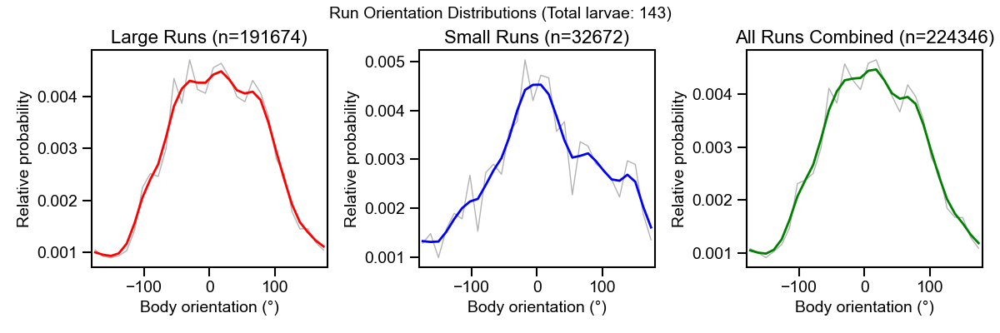

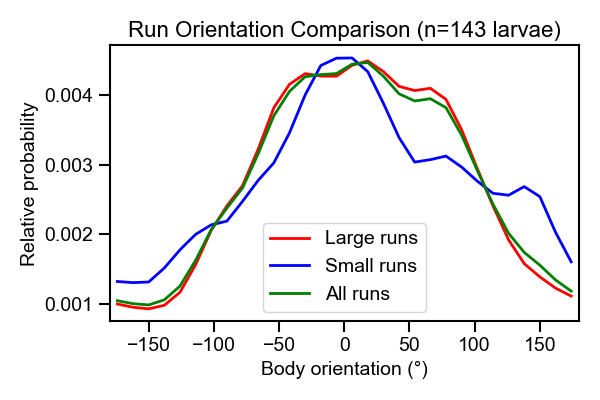

In [20]:
# For all experiments
all_exp_results = processor.analyze_run_orientations_all(filtered_all_data_control)

## Run probability as a function of orientation

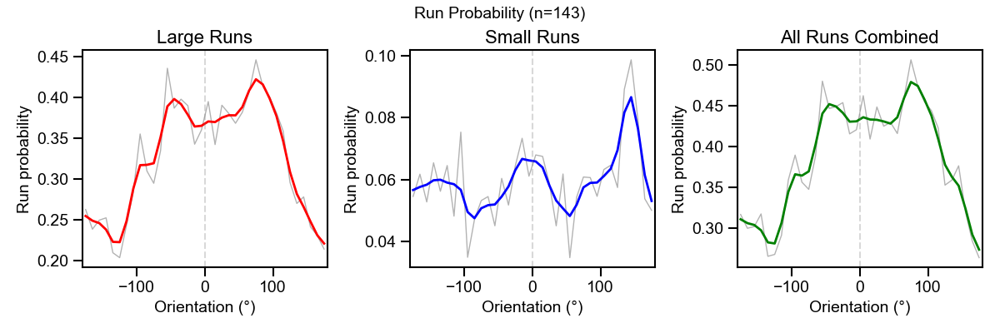

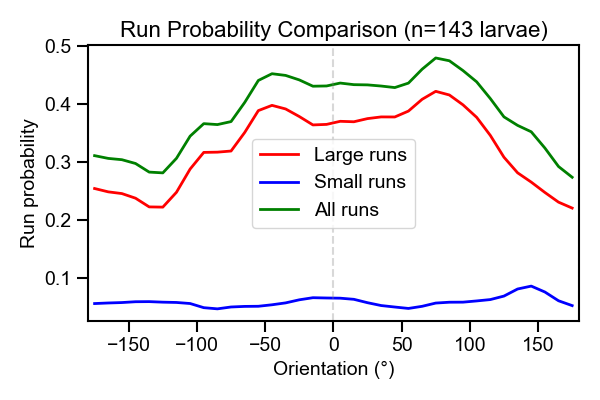

In [21]:
# Calculate run probability as a function of orientationa
run_prob_results = processor.analyze_run_rate_by_orientation(filtered_all_data_control)

## Both (polar plots)

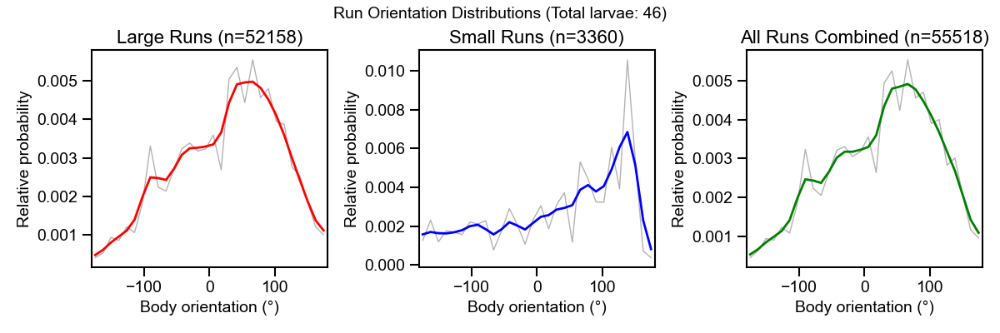

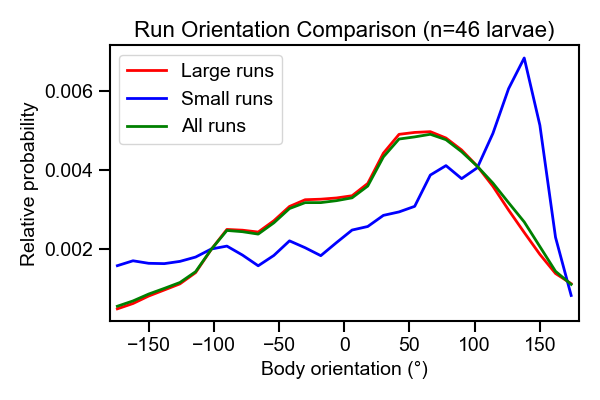

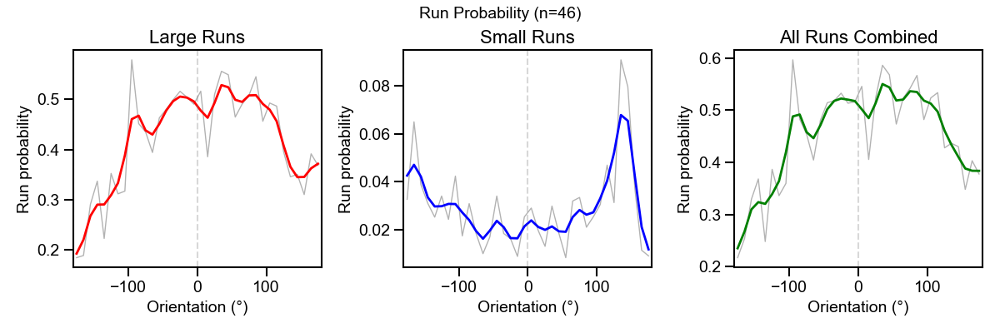

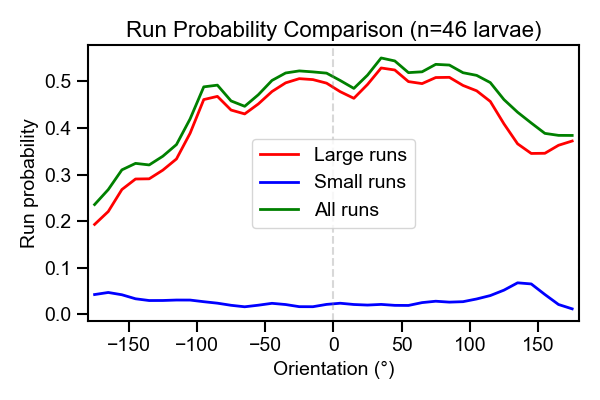

/Users/sharbat/Projects/anemotaxis/src/processor.py:8671: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6),


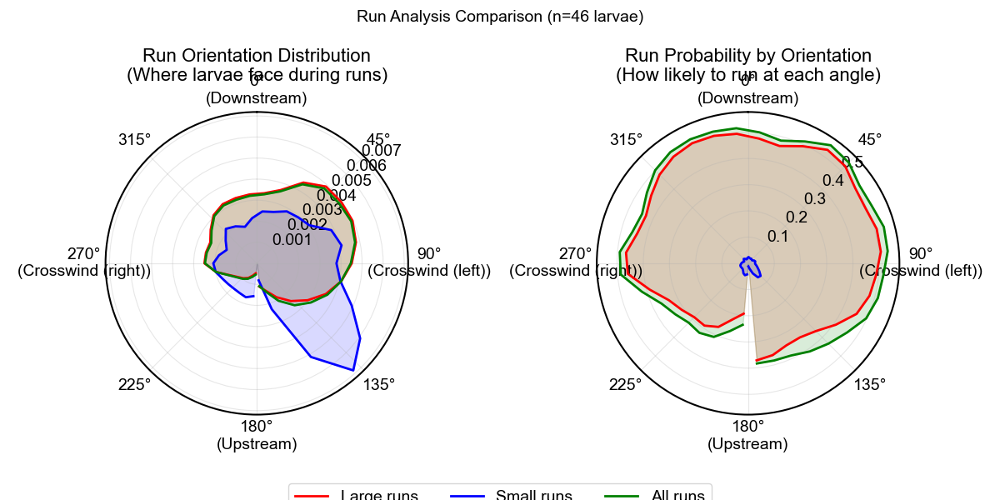

{'orientation_results': {'large_run_orientations': array([-29.52031861, -30.39880645, -36.38153027, ...,  58.57749481,
          54.82143832,  59.97515734], shape=(52158,)),
  'small_run_orientations': array([118.50390897, 120.89747531, 124.6297336 , ...,  64.11017198,
          67.59695552,  63.45104912], shape=(3360,)),
  'all_run_orientations': array([-29.52031861, -30.39880645, -36.38153027, ...,  64.11017198,
          67.59695552,  63.45104912], shape=(55518,)),
  'hist_large': array([0.00040582, 0.00052724, 0.00093306, 0.00085318, 0.00120627,
         0.00105768, 0.00182618, 0.00330726, 0.002232  , 0.00213774,
         0.00270972, 0.00323217, 0.00338075, 0.00317784, 0.00322897,
         0.00359005, 0.00268895, 0.00504397, 0.00534594, 0.00443364,
         0.00554245, 0.00455986, 0.00479313, 0.00393995, 0.00386646,
         0.00275445, 0.00252598, 0.00183417, 0.00119988, 0.00099857]),
  'hist_small': array([0.00126488, 0.00230655, 0.00119048, 0.00176091, 0.00168651,
         0.001

In [22]:
processor.plot_polar_run_types_comparison(merged_data, bin_width=10, save_path=None)

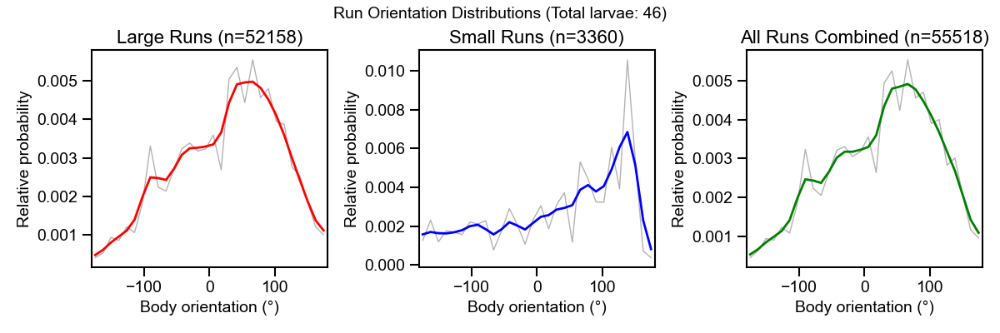

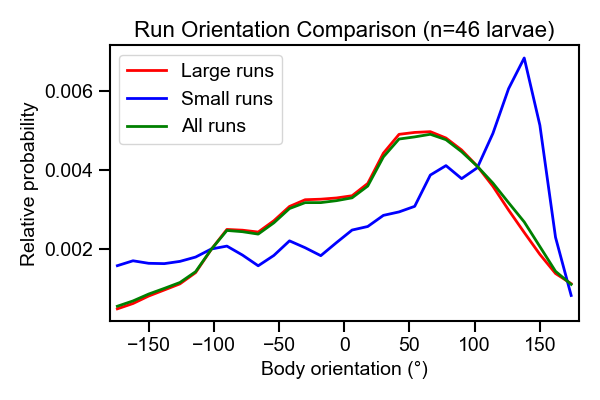

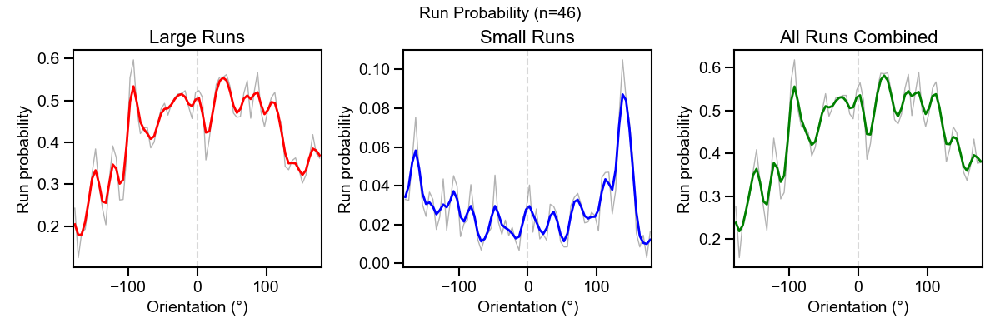

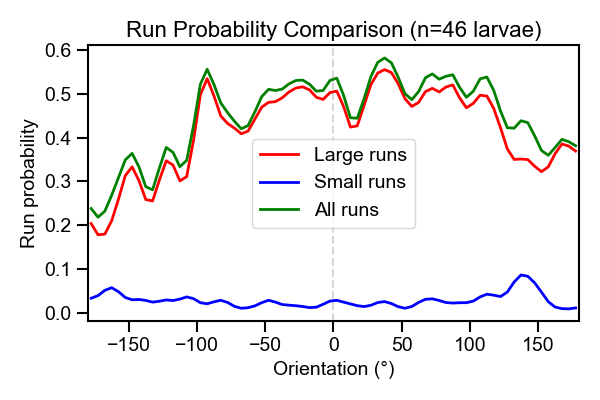

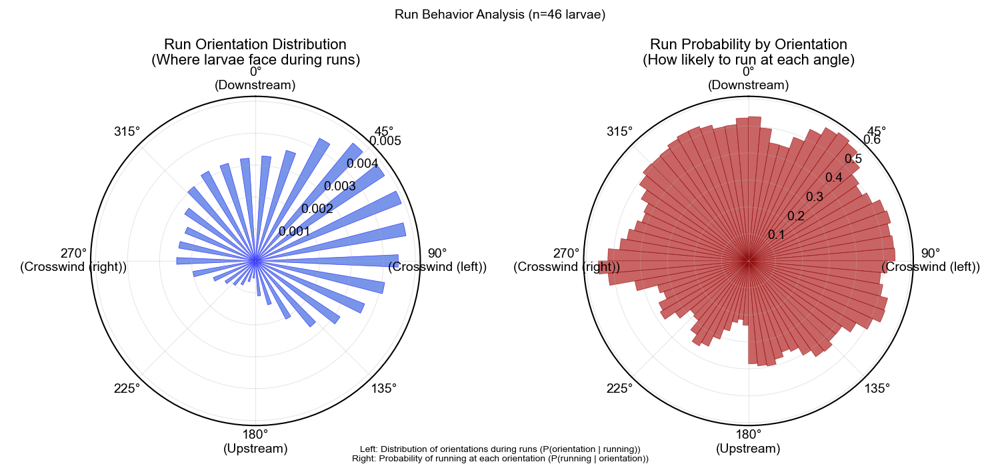

In [23]:
# Plot run analysis with polar histograms
results = processor.plot_polar_run_histograms(
    merged_data, 
    bin_width=5,
    save_path="/Users/sharbat/Projects/anemotaxis/results/figures/run_polar_histograms.png"
)

# Cast (sweep + turn) statistics

# Sub-dividing `cast`

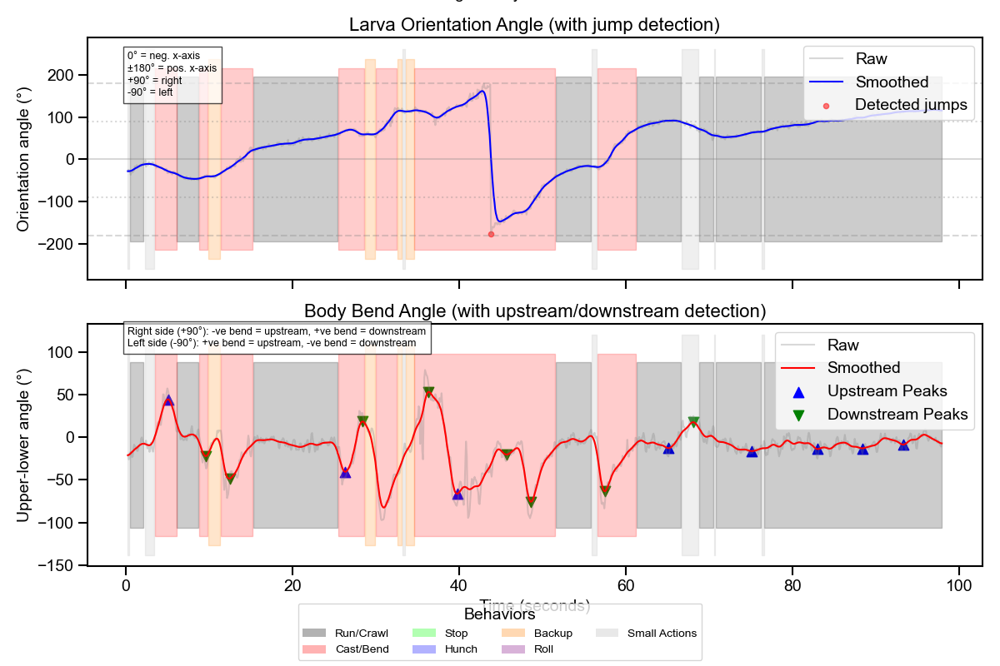

In [24]:
first_larva = sorted(filtered_extracted_data.keys())[0]
results = processor.plot_filtered_angles(
    filtered_extracted_data,  # Your tracking data
    larva_id=first_larva,     # Specific larva or None for random
    smooth_window=15,          # Smoothing strength
    jump_threshold=50         # Degrees per frame threshold for jumps
)

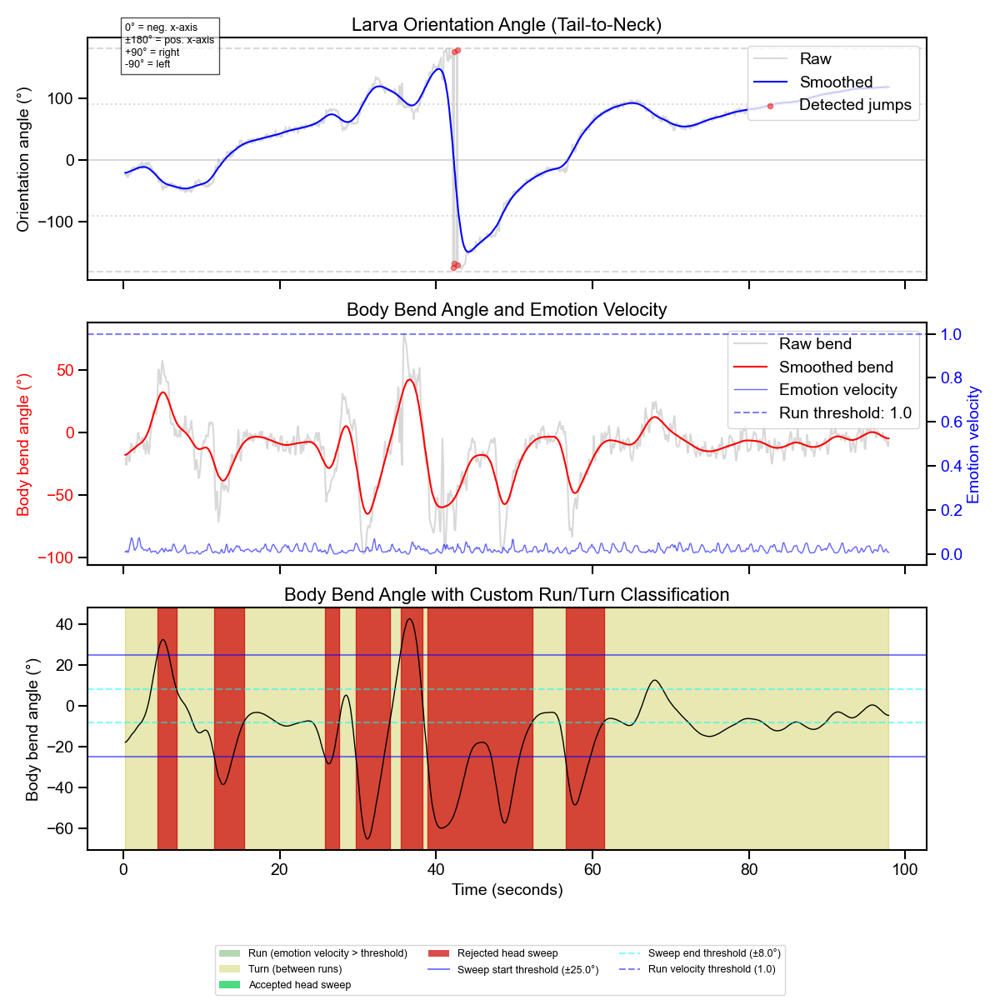

In [25]:
# Example call with custom thresholds, including velocity threshold
results = processor.plot_filtered_angles_enhanced(
    filtered_extracted_data,
    larva_id=first_larva,
    smooth_window=30,
    jump_threshold=50,
    sweep_start_threshold=25.0,  # Head sweep start threshold (degrees)
    sweep_end_threshold=8.0,     # Head sweep end threshold (degrees)
    velocity_run_threshold=1.0   # Run definition threshold (velocity units)
)

In [26]:
# With default parameters
# results = trx_processor.plot_combined_behavioral_analysis(filtered_extracted_data)

# With custom parameters
# results = processor.plot_combined_behavioral_analysis(
#     filtered_extracted_data, 
#     larva_id=first_larva,
#     smooth_window=30,           # Add this parameter
#     jump_threshold=50,          # Add this parameter
#     sweep_start_threshold=12.0,
#     sweep_end_threshold=8.0,
#     velocity_run_threshold=0.6
# )

In [27]:
all_cast_peaks = processor.detect_cast_peaks(filtered_all_data_control)

Detected 0 cast peaks across 0 larvae
First peaks: 0.0 (nan%), Last peaks: 0.0 (nan%)
Accepted peaks: 0.0 (nan%)


/Users/sharbat/Projects/anemotaxis/src/processor.py:8178: RuntimeWarning: invalid value encountered in scalar divide
  print(f"First peaks: {n_first} ({n_first/n_total*100:.1f}%), Last peaks: {n_last} ({n_last/n_total*100:.1f}%)")
/Users/sharbat/Projects/anemotaxis/src/processor.py:8179: RuntimeWarning: invalid value encountered in scalar divide
  print(f"Accepted peaks: {n_accepted} ({n_accepted/n_total*100:.1f}%)")


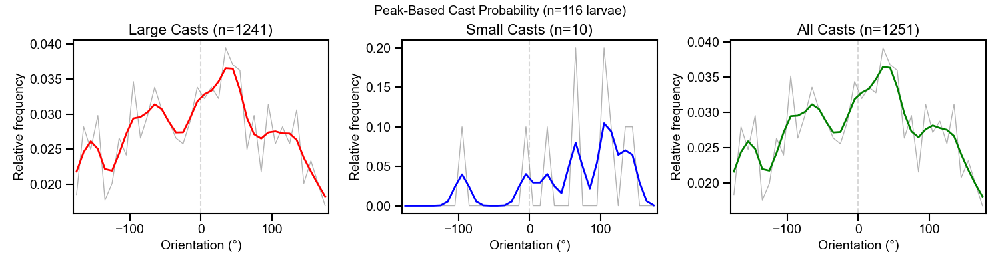

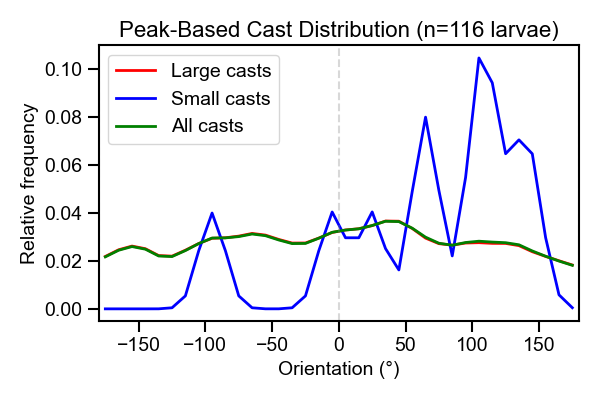

In [28]:
# Analyze all data
all_cast_ = processor.analyze_turn_rate_by_orientation_new(merged_data_exp, larva_id=None, bin_width=10, 
                                    smooth_window=50, jump_threshold=15, 
                                    peak_threshold=5, peak_prominence=5)

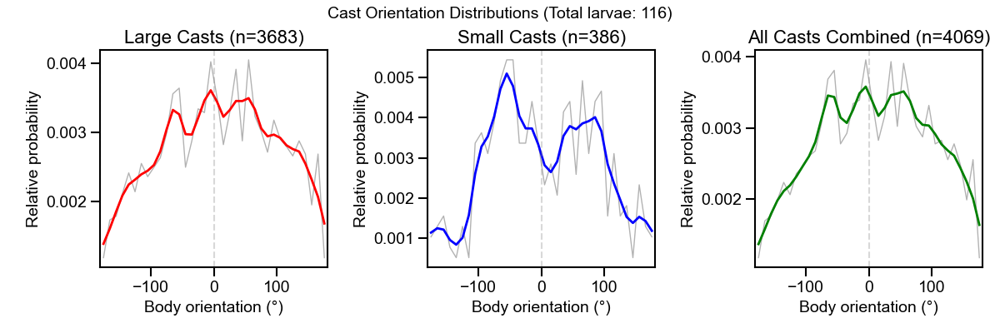

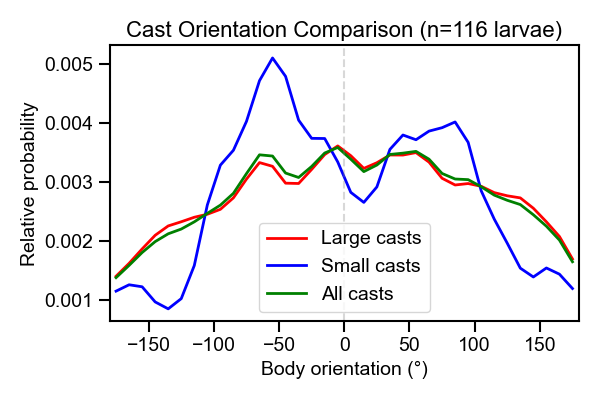

In [29]:
# Example usage
cast_results = processor.analyze_cast_orientations_all_new(merged_data_exp)


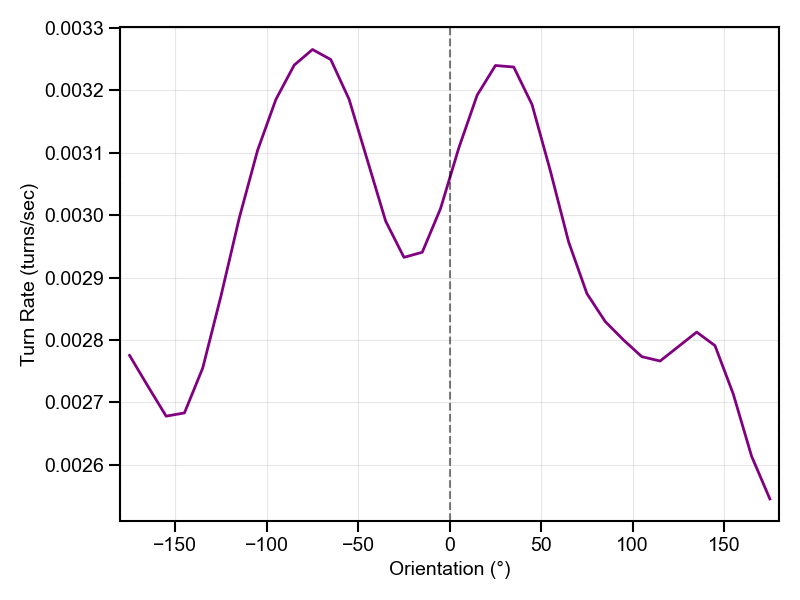

{'bin_centers': array([-175., -165., -155., -145., -135., -125., -115., -105.,  -95.,
         -85.,  -75.,  -65.,  -55.,  -45.,  -35.,  -25.,  -15.,   -5.,
           5.,   15.,   25.,   35.,   45.,   55.,   65.,   75.,   85.,
          95.,  105.,  115.,  125.,  135.,  145.,  155.,  165.,  175.]),
 'turn_counts': array([25., 23., 17., 22., 25., 21., 30., 29., 29., 35., 30., 40., 33.,
        35., 27., 38., 25., 29., 40., 34., 25., 46., 35., 33., 32., 27.,
        25., 41., 30., 18., 29., 34., 21., 23., 21., 18.]),
 'total_time': array([ 7794.664,  8274.666,  8782.937,  8291.47 ,  8525.284,  8630.733,
         8843.991,  9086.366,  9425.542, 10225.035,  9969.707, 10414.002,
        10799.968, 10571.41 , 10818.506, 11370.861, 11393.893, 10547.095,
        10441.88 , 10253.781, 10228.218, 10845.337, 11233.97 , 10729.93 ,
        10849.49 , 10660.845, 11068.625, 10350.959, 11170.042, 10773.247,
         9880.686,  9264.602,  8317.554,  7890.12 ,  7899.235,  8313.402]),
 'turn_rate_per_se

In [30]:
processor.analyze_turn_rate_by_orientation_true(
    merged_data_exp, bin_width=10, show_plot=True, ax=None, sigma=2, min_turn_amplitude=10
)

## IMP : CHECK THE CAST DIRECTION NEGATIVE/POSITIVE VALUE!!!

# Cast Direction

Analyzing Control...
Analyzing Experimental...
Creating comparison plots...


/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_all_peaks_Control_vs_Experimental_20250723_081026.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_all_peaks_Control_vs_Experimental_20250723_081026.svg


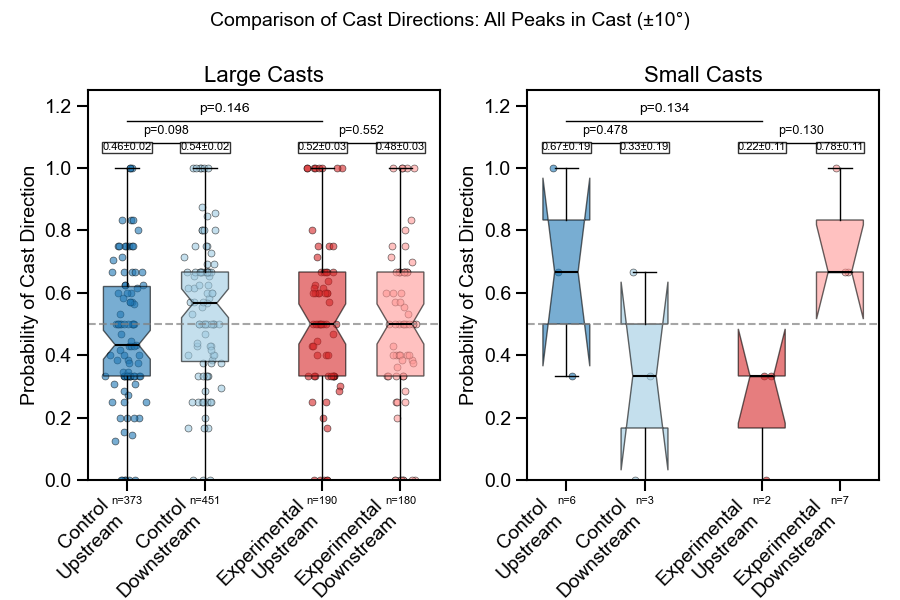

Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_first_peaks_Control_vs_Experimental_20250723_081026.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_first_peaks_Control_vs_Experimental_20250723_081026.svg


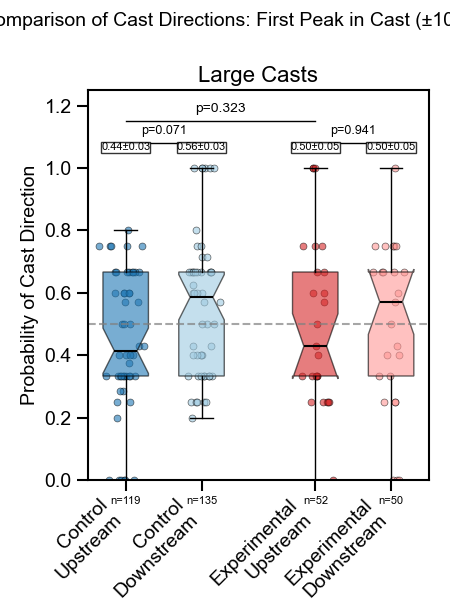

Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_last_peaks_Control_vs_Experimental_20250723_081026.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_last_peaks_Control_vs_Experimental_20250723_081026.svg


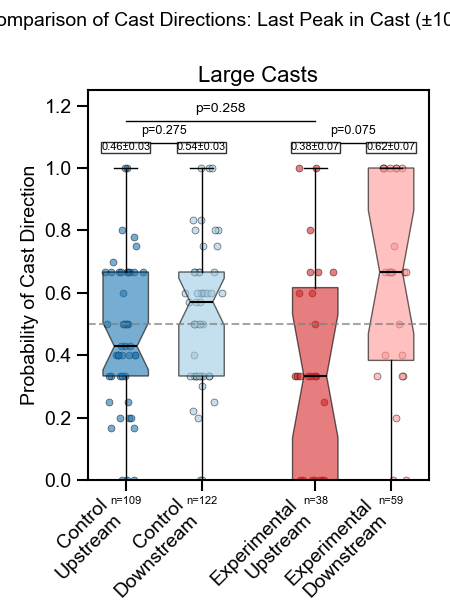

Saved statistics to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_stats_Control_vs_Experimental_20250723_081026.txt


In [31]:
# Example usage:
control_data = merged_data_control
experimental_data = merged_data_exp

basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_directions_peaks(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    angle_width=10,
    smooth_window=5,
    jump_threshold=30,
    basepath=basepath
)


# Cast Amplitude

Analyzing Control...
Analyzing Experimental...


/Users/sharbat/Projects/anemotaxis/src/processor.py:13407: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot([2, 5], [down_maxheight, down_maxheight], 'k-', lw=1, linestyle='--')
/Users/sharbat/Projects/anemotaxis/src/processor.py:13407: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot([2, 5], [down_maxheight, down_maxheight], 'k-', lw=1, linestyle='--')


Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_all_peaks_Control_vs_Experimental_20250723_081028.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_all_peaks_Control_vs_Experimental_20250723_081028.svg


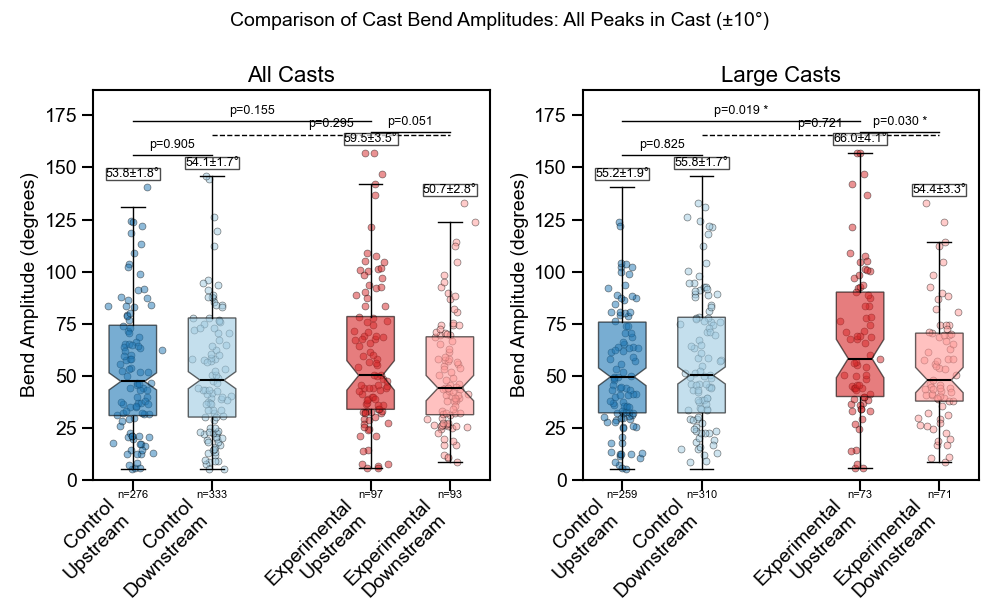

/Users/sharbat/Projects/anemotaxis/src/processor.py:13407: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot([2, 5], [down_maxheight, down_maxheight], 'k-', lw=1, linestyle='--')
/Users/sharbat/Projects/anemotaxis/src/processor.py:13407: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot([2, 5], [down_maxheight, down_maxheight], 'k-', lw=1, linestyle='--')


Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_first_peaks_Control_vs_Experimental_20250723_081028.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_first_peaks_Control_vs_Experimental_20250723_081028.svg


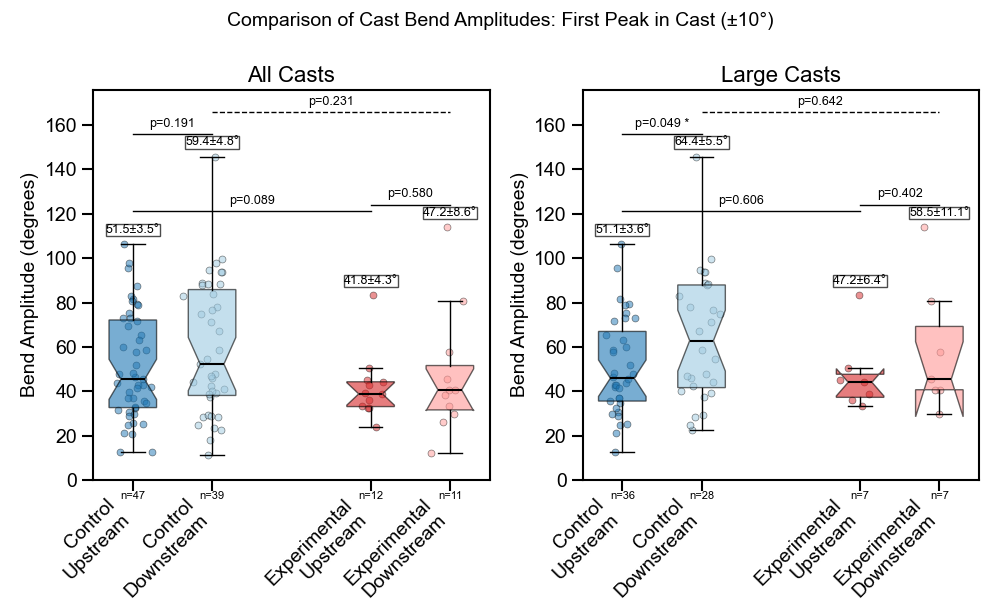

/Users/sharbat/Projects/anemotaxis/src/processor.py:13407: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot([2, 5], [down_maxheight, down_maxheight], 'k-', lw=1, linestyle='--')
/Users/sharbat/Projects/anemotaxis/src/processor.py:13407: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot([2, 5], [down_maxheight, down_maxheight], 'k-', lw=1, linestyle='--')


Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_last_peaks_Control_vs_Experimental_20250723_081028.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_last_peaks_Control_vs_Experimental_20250723_081028.svg


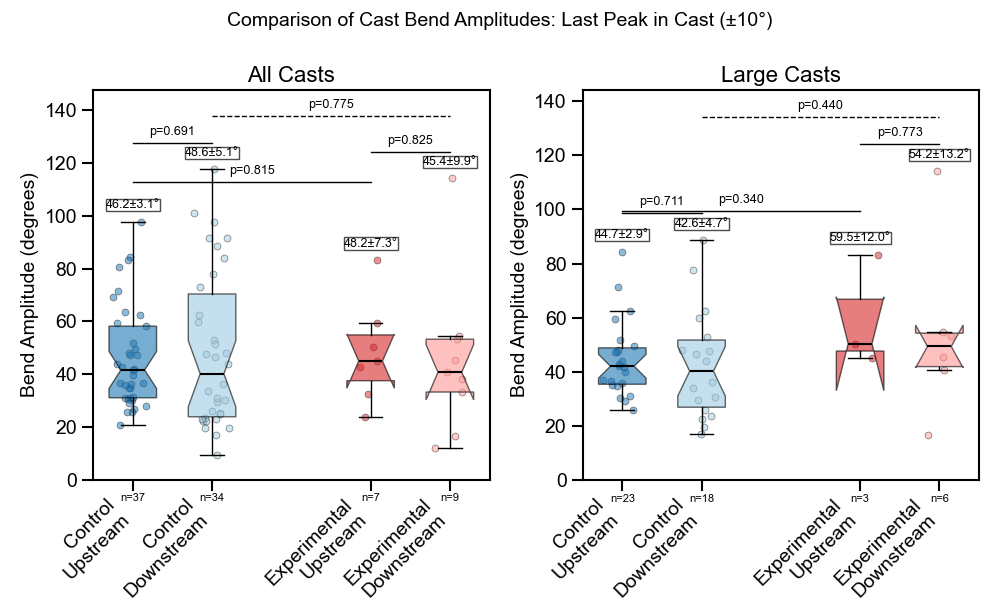

Saved statistics to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_stats_Control_vs_Experimental_20250723_081028.txt


In [32]:
# Example usage:
control_data = merged_data_control
experimental_data = merged_data_exp

basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

amplitude_results = processor.compare_cast_amplitudes_by_direction_peaks(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    angle_width=10,
    smooth_window=5,
    jump_threshold=30,
    basepath=basepath
)

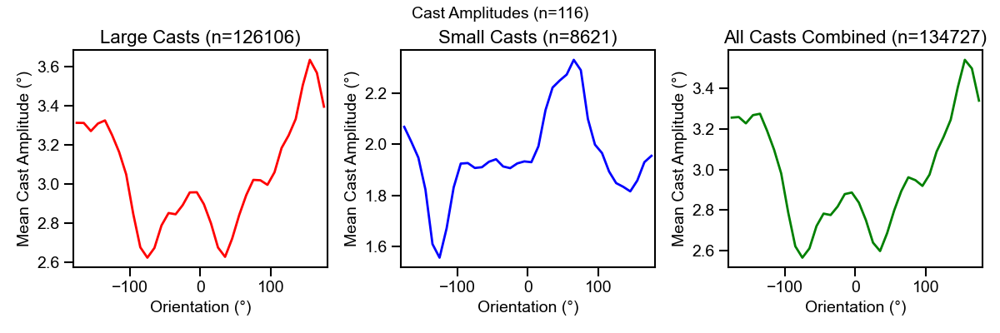

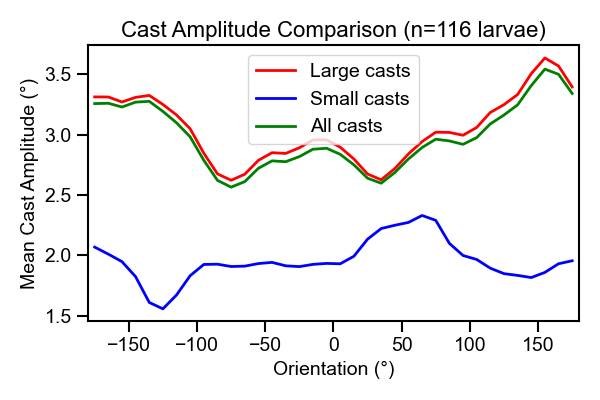

In [33]:
# Analyze all data
all_larvae_turns = processor.analyze_turn_amplitudes_by_orientation(
    merged_data_exp
)

In [34]:
# Analyze turn rates in lateral quadrants
# lateral_stats = trx_processor.analyze_lateral_turn_rates(filtered_all_data, 
#                                          angle_width=15,
#                                          bin_width=5)

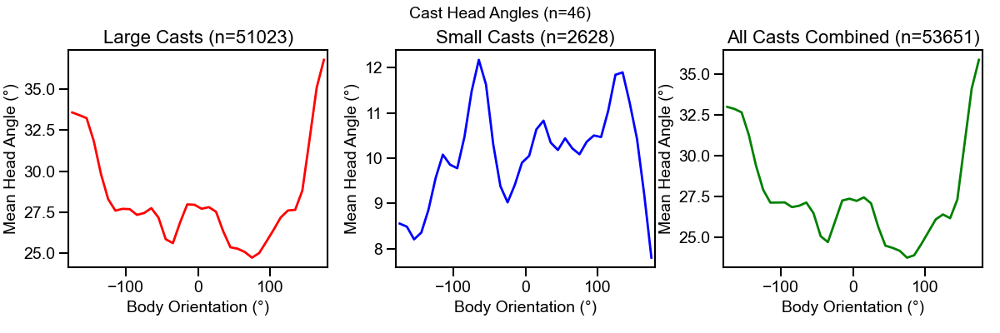

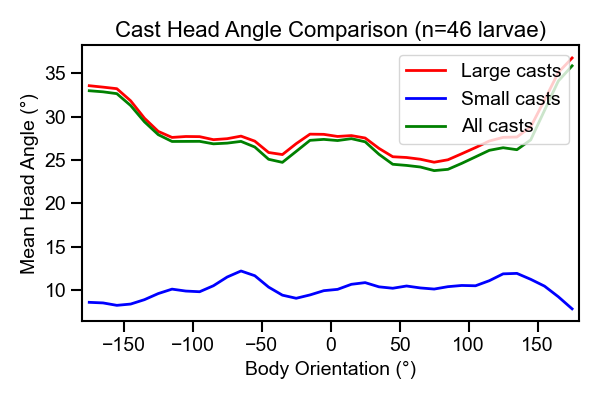

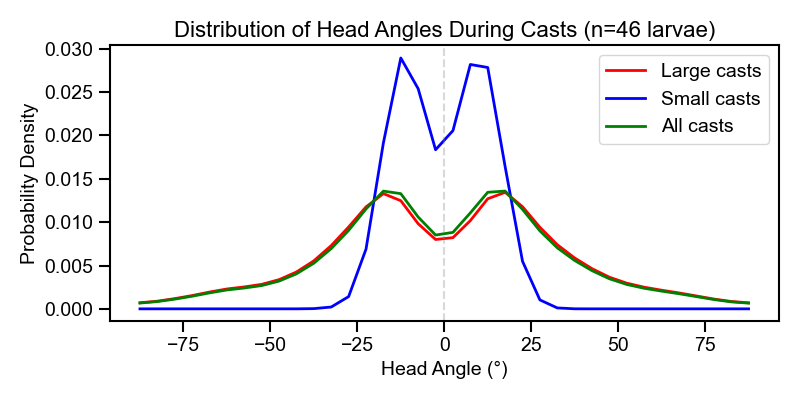

In [35]:
# Calculate head angles during cast events
head_angle_results = processor.analyze_cast_head_angles_by_orientation(merged_data)

# If you want to analyze specific larvae
# single_larva_head_angles = trx_processor.analyze_cast_head_angles_by_orientation(filtered_all_data, larva_id="larva1")

# If you want to change bin width
# finer_bins = trx_processor.analyze_cast_head_angles_by_orientation(filtered_all_data, bin_width=5)

Analyzing Control...


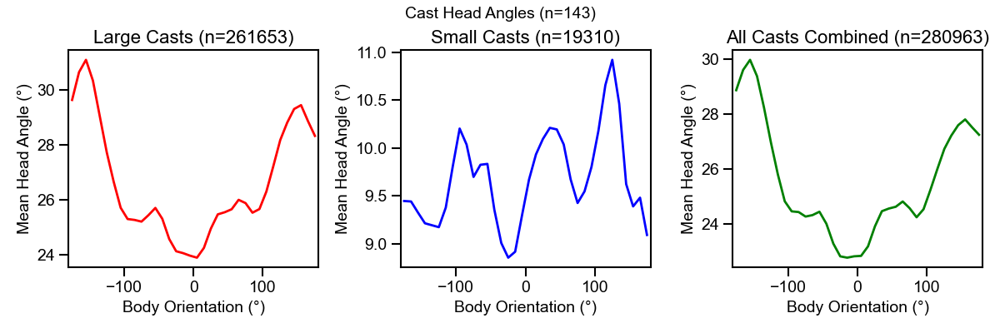

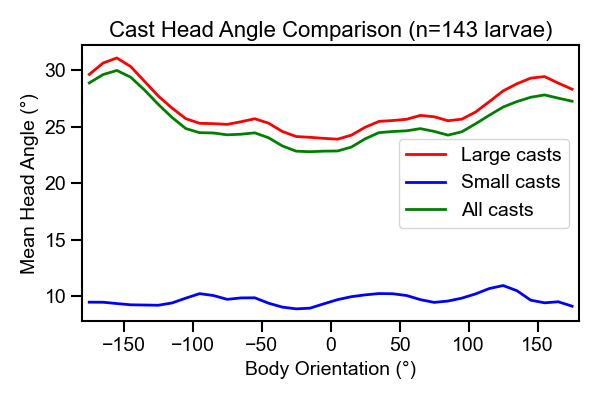

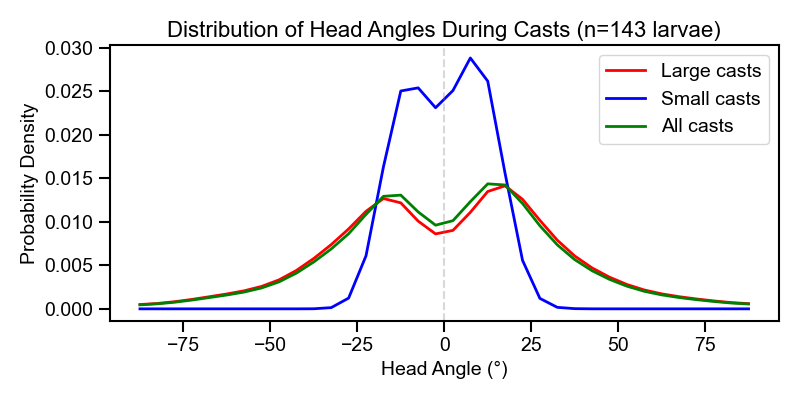

Analyzing Experimental...


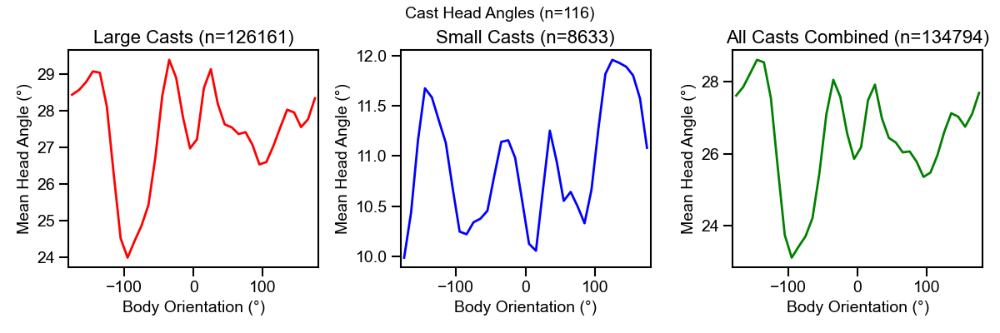

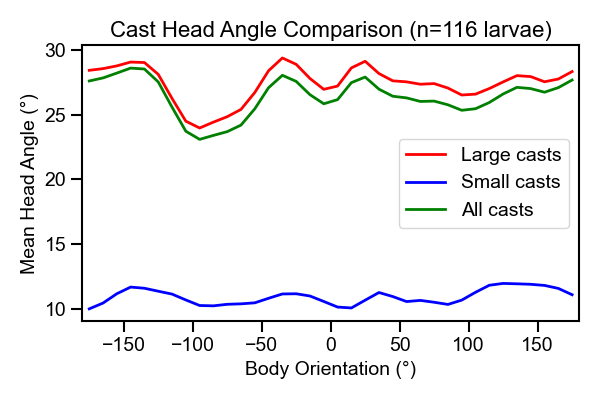

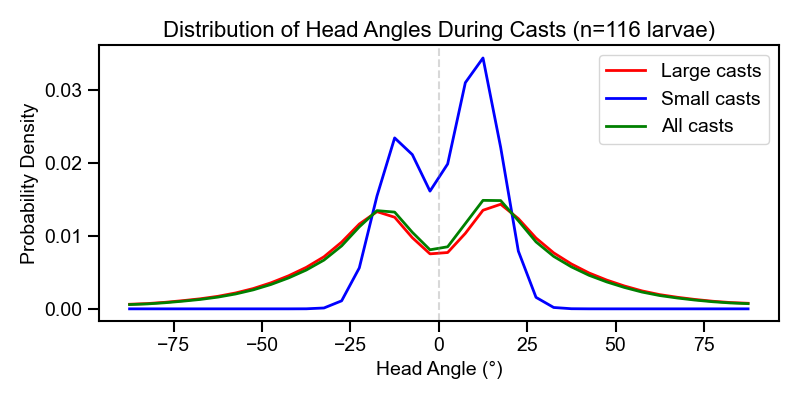

OSError: [Errno 30] Read-only file system: "/Volumes/Sharbat'sDrive4TB/T2_Ladder_Neuron_Data/Anemotaxis/GMR_SS01632@UAS_TNT_2_0003_p_3gradient1/p_3gradient1_2s1x600s0s#n#n#n/head_angle_comparison_Control_vs_Experimental_20250723_081040.svg"

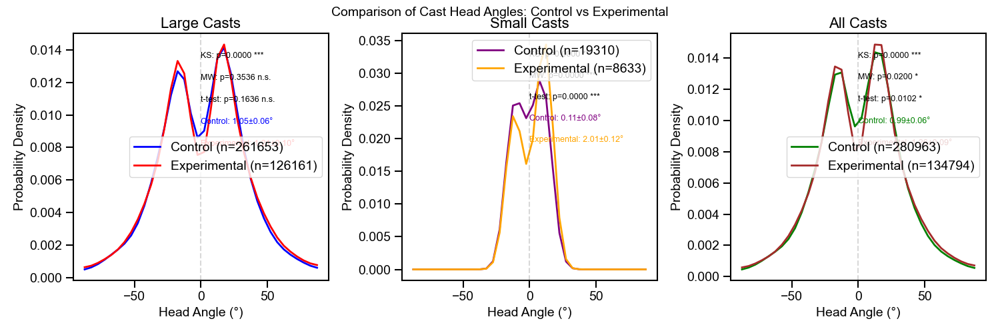

In [36]:
# Example usage:
control_data = merged_data_control
experimental_data = merged_data_exp

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_head_angles(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=10,
    basepath=base_path  # Changed from base_path to basepath
)

Analyzing Control...


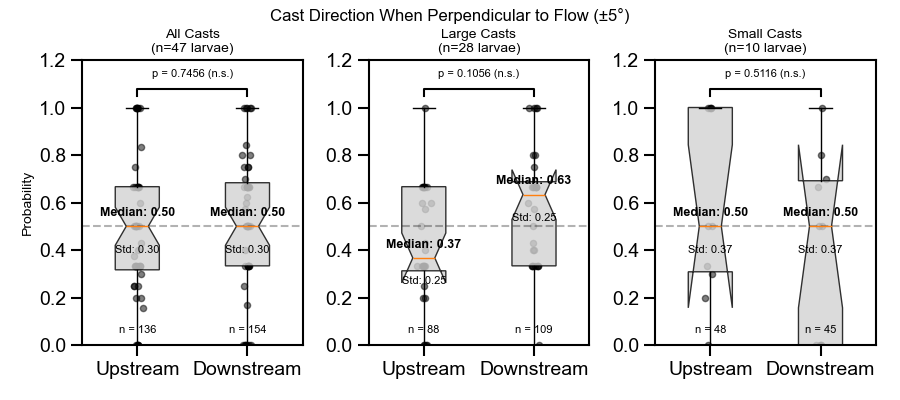

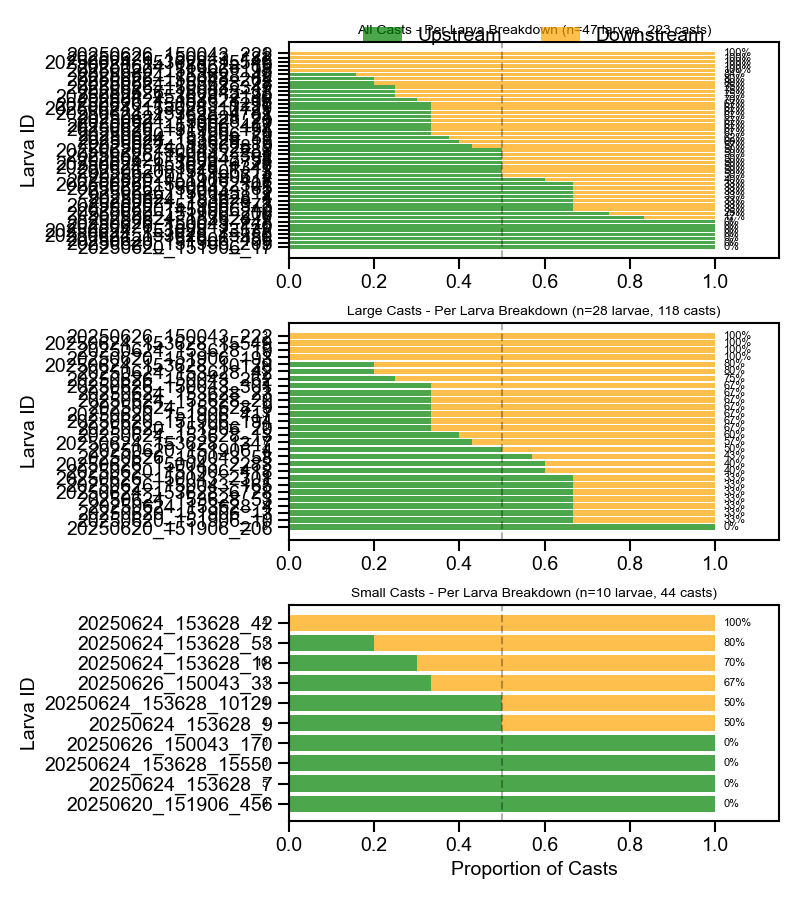


Summary of Cast Direction Analysis:
Analyzed 47 larvae with cast events during perpendicular orientation (±5°)

All Casts:
  Total: 290 casts from 47 larvae
  Upstream: 136 (46.9%), Downstream: 154 (53.1%)
  Upstream mean: 0.486 ± 0.297 (std)
  Downstream mean: 0.514 ± 0.297 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 1.12, p = 0.2905 (not significant)
  Paired T-Test: t = -0.33, p = 0.7456 (not significant)

Large Casts:
  Total: 197 casts from 28 larvae
  Upstream: 88 (44.7%), Downstream: 109 (55.3%)
  Upstream mean: 0.420 ± 0.249 (std)
  Downstream mean: 0.580 ± 0.249 (std)
  Upstream median: 0.367
  Downstream median: 0.633
  Chi-Square Test: χ² = 2.24, p = 0.1346 (not significant)
  Paired T-Test: t = -1.67, p = 0.1056 (not significant)

Small Casts:
  Total: 93 casts from 10 larvae
  Upstream: 48 (51.6%), Downstream: 45 (48.4%)
  Upstream mean: 0.583 ± 0.366 (std)
  Downstream mean: 0.417 ± 0.366 (std)
  Upstream median: 0.500
  Downstream m

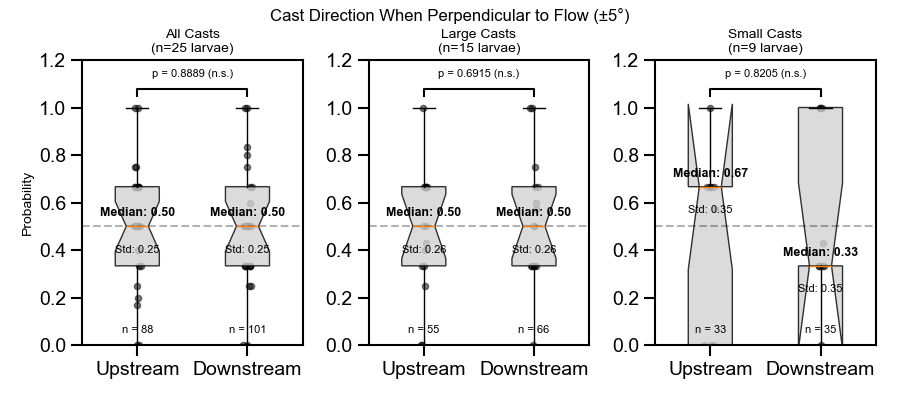

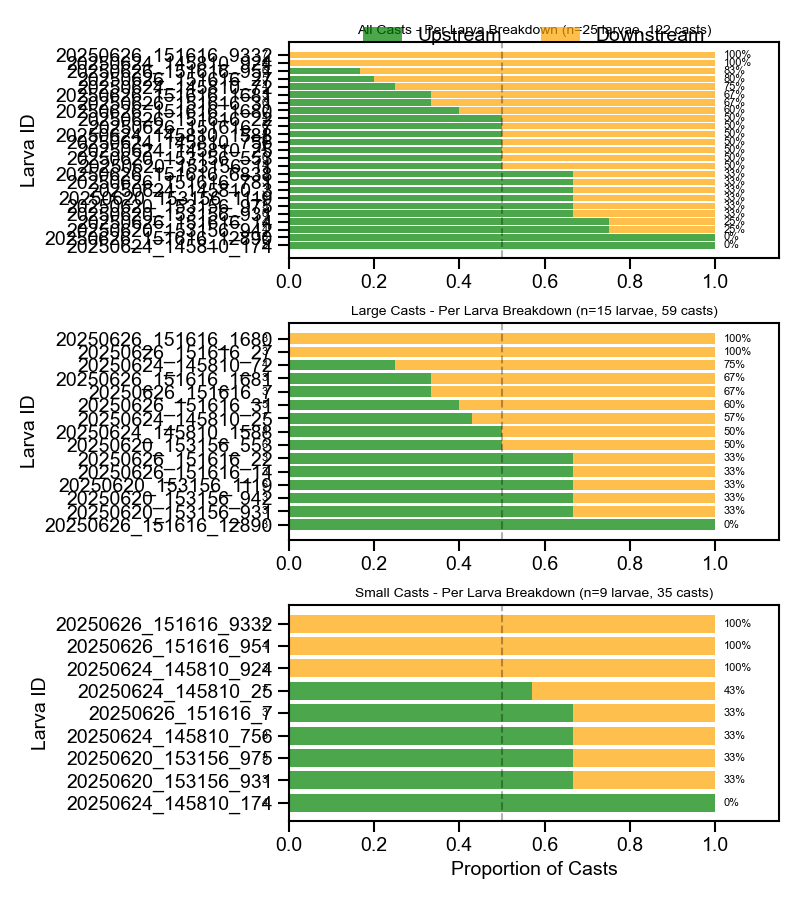


Summary of Cast Direction Analysis:
Analyzed 25 larvae with cast events during perpendicular orientation (±5°)

All Casts:
  Total: 189 casts from 25 larvae
  Upstream: 88 (46.6%), Downstream: 101 (53.4%)
  Upstream mean: 0.507 ± 0.255 (std)
  Downstream mean: 0.493 ± 0.255 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 0.89, p = 0.3443 (not significant)
  Paired T-Test: t = 0.14, p = 0.8889 (not significant)

Large Casts:
  Total: 121 casts from 15 larvae
  Upstream: 55 (45.5%), Downstream: 66 (54.5%)
  Upstream mean: 0.472 ± 0.260 (std)
  Downstream mean: 0.528 ± 0.260 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 1.00, p = 0.3173 (not significant)
  Paired T-Test: t = -0.41, p = 0.6915 (not significant)

Small Casts:
  Total: 68 casts from 9 larvae
  Upstream: 33 (48.5%), Downstream: 35 (51.5%)
  Upstream mean: 0.471 ± 0.351 (std)
  Downstream mean: 0.529 ± 0.351 (std)
  Upstream median: 0.667
  Downstream media

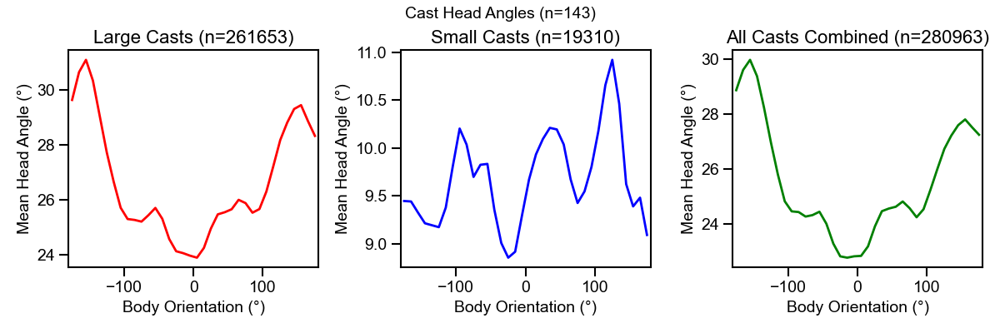

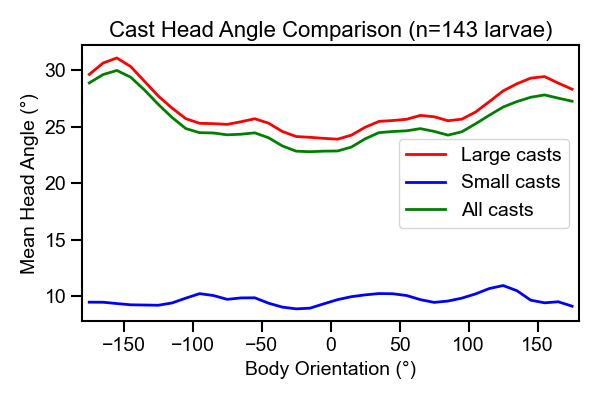

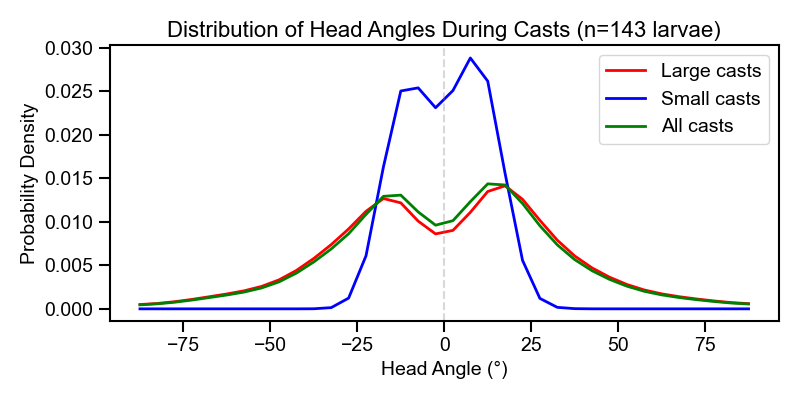

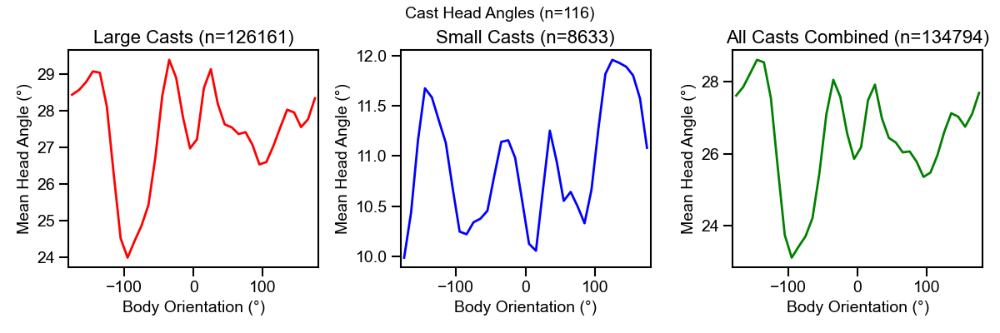

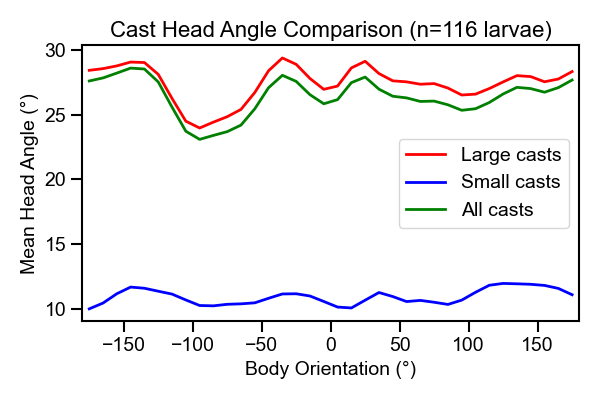

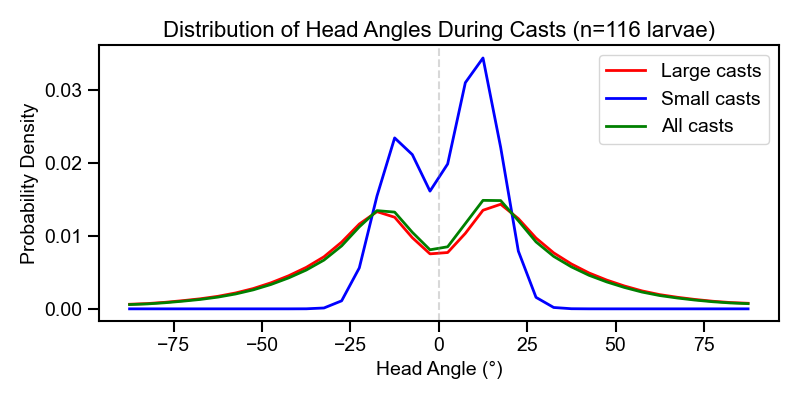

OSError: [Errno 30] Read-only file system: "/Volumes/Sharbat'sDrive4TB/T2_Ladder_Neuron_Data/Anemotaxis/GMR_SS01632@UAS_TNT_2_0003_p_3gradient1/p_3gradient1_2s1x600s0s#n#n#n/head_angle_curves_comparison_Control_vs_Experimental_20250723_081155.svg"

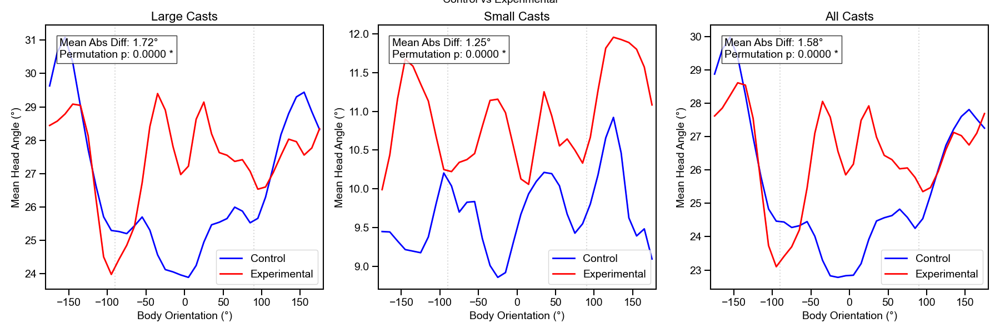

In [37]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_directions_new(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    basepath=base_path
)

Analyzing Control...


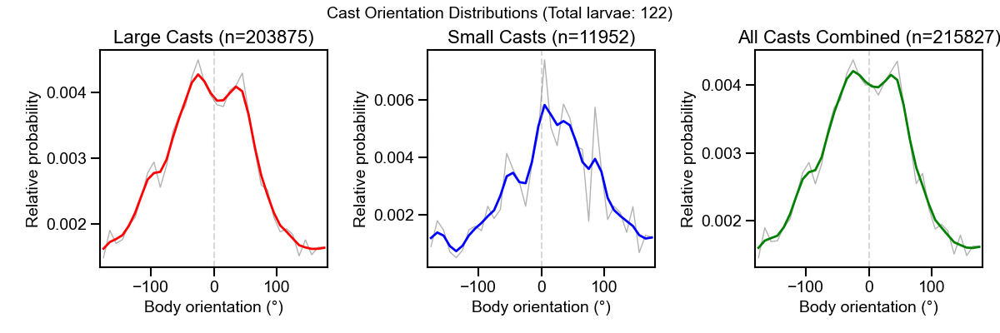

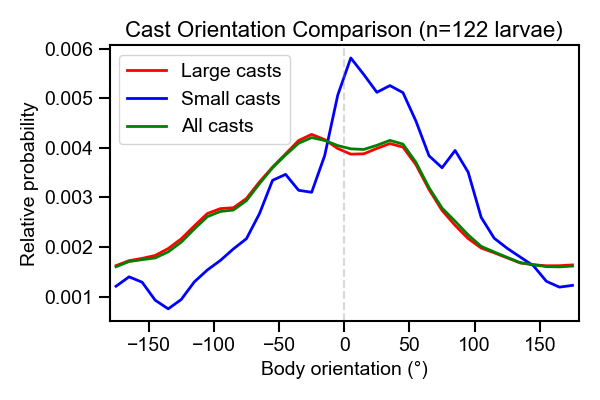

Analyzing Experimental...


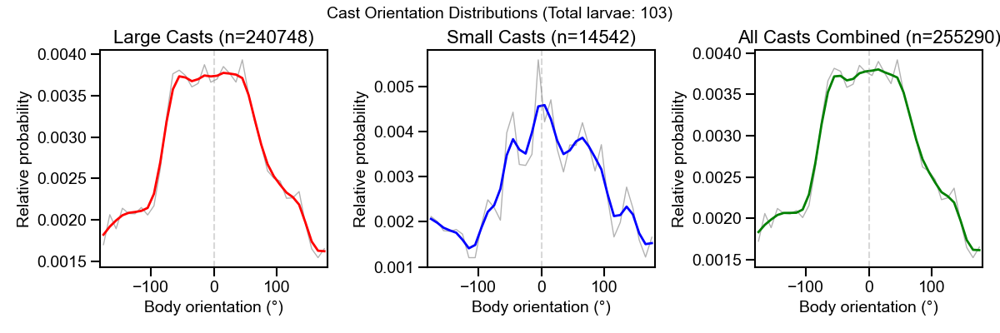

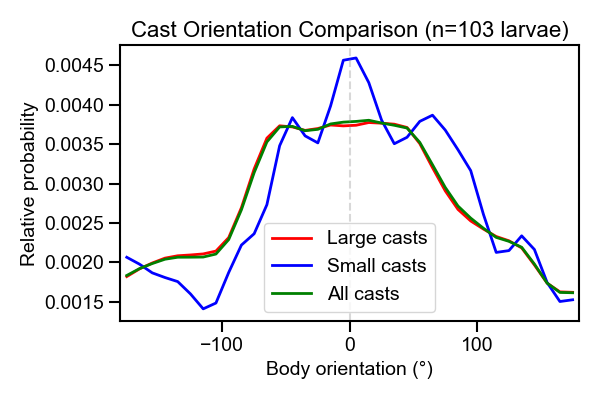

OSError: [Errno 30] Read-only file system: "/Volumes/Sharbat'sDrive4TB/T2_Ladder_Neuron_Data/Anemotaxis/GMR_SS01632@UAS_TNT_2_0003_p_5gradient2/p_5gradient2_2s1x600s0s#n#n#n/cast_orientation_comparison_Control_vs_Experimental_20250723_080333.svg"

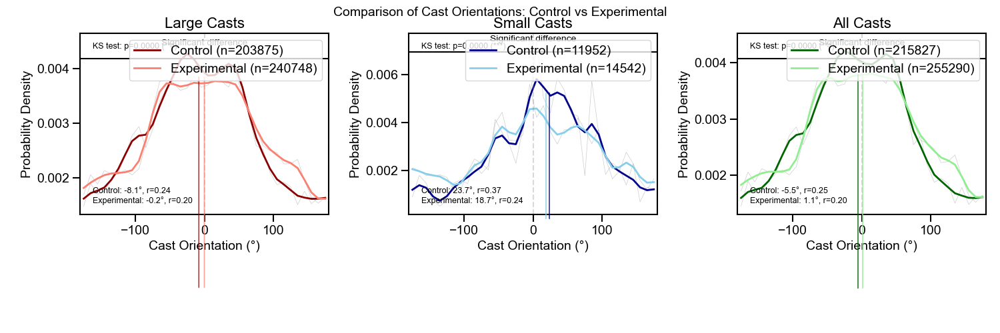

In [ ]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_orientations(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=10,
    basepath=base_path
)

Analyzing Control...


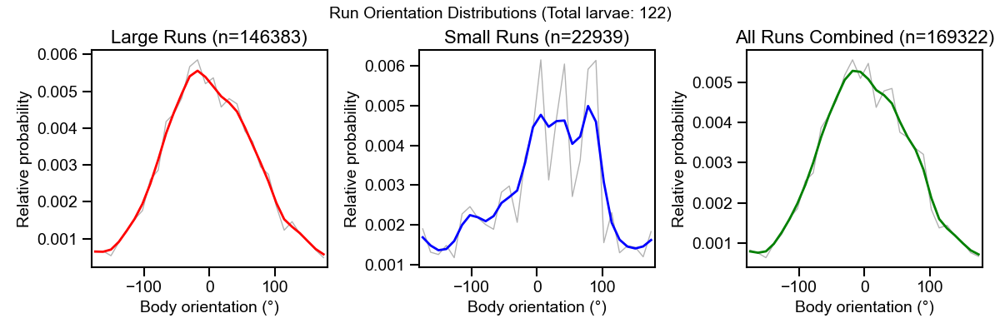

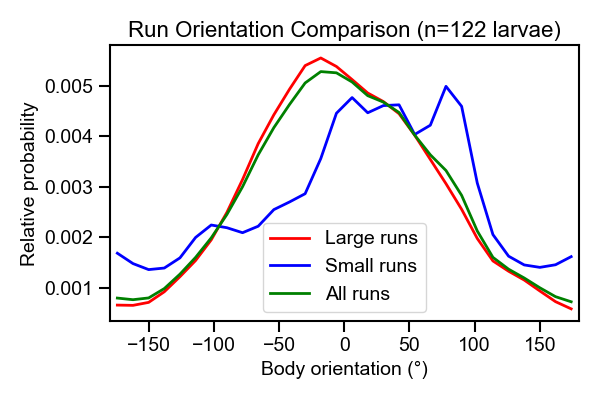

Analyzing Experimental...


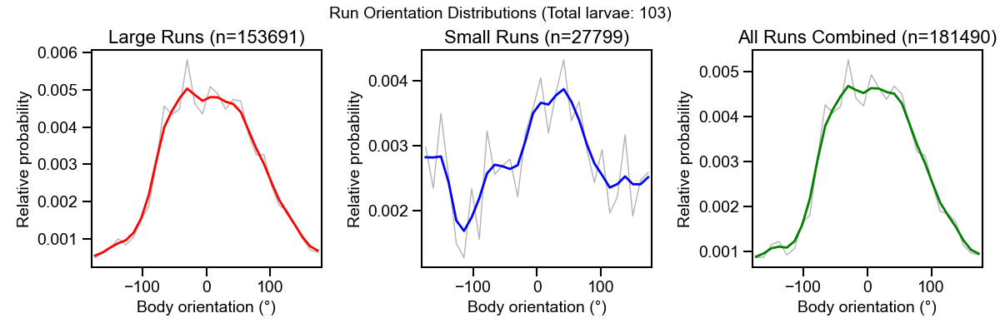

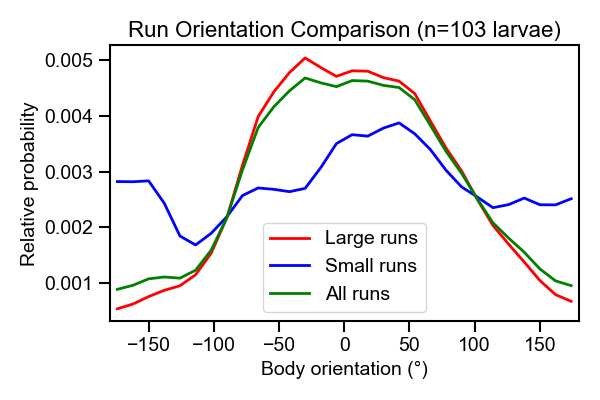

OSError: [Errno 30] Read-only file system: "/Volumes/Sharbat'sDrive4TB/T2_Ladder_Neuron_Data/Anemotaxis/GMR_SS01632@UAS_TNT_2_0003_p_5gradient2/p_5gradient2_2s1x600s0s#n#n#n/run_orientation_comparison_Control_vs_Experimental_20250723_080407.svg"

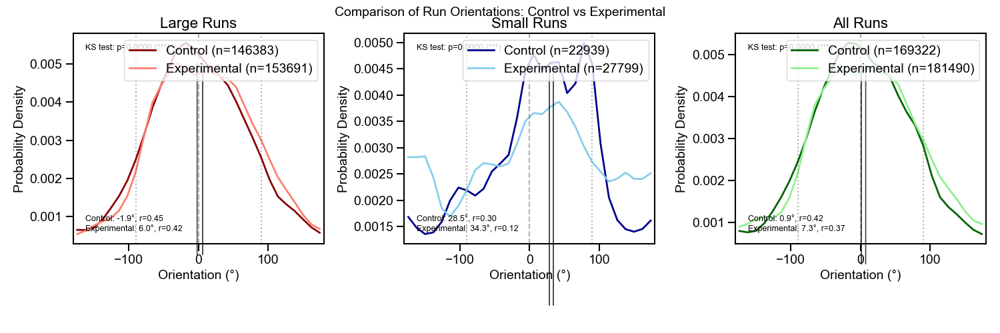

In [ ]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_run_orientations(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=12,
    basepath=base_path
)

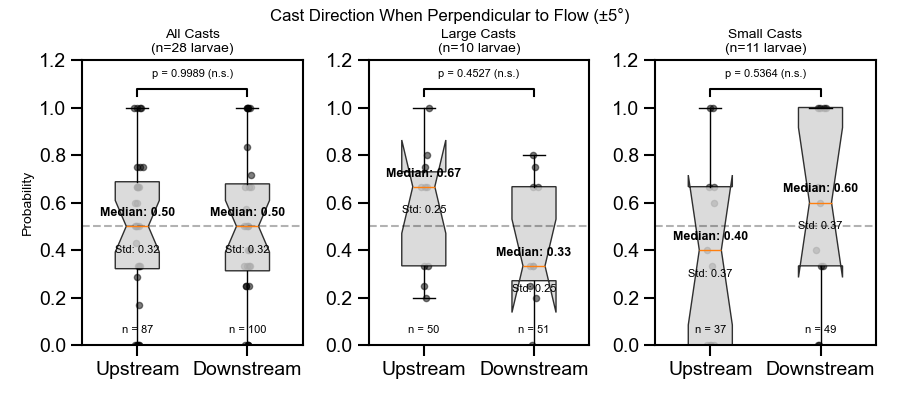

OSError: [Errno 30] Read-only file system: "/Volumes/Sharbat'sDrive4TB/T2_Ladder_Neuron_Data/Anemotaxis/GMR_SS01632@UAS_TNT_2_0003_p_5gradient2/p_5gradient2_2s1x600s0s#n#n#n/perpendicular_cast_boxplot_angle5_20250723_080439.svg"

In [ ]:
# Analyze cast directions relative to wind
cast_stats = processor.analyze_perpendicular_cast_directions_new(filtered_all_data, angle_width=5, min_frame=3, basepath=base_path)

Analyzing Control...


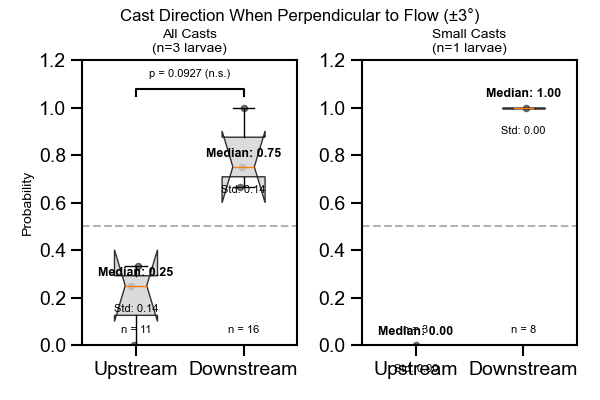

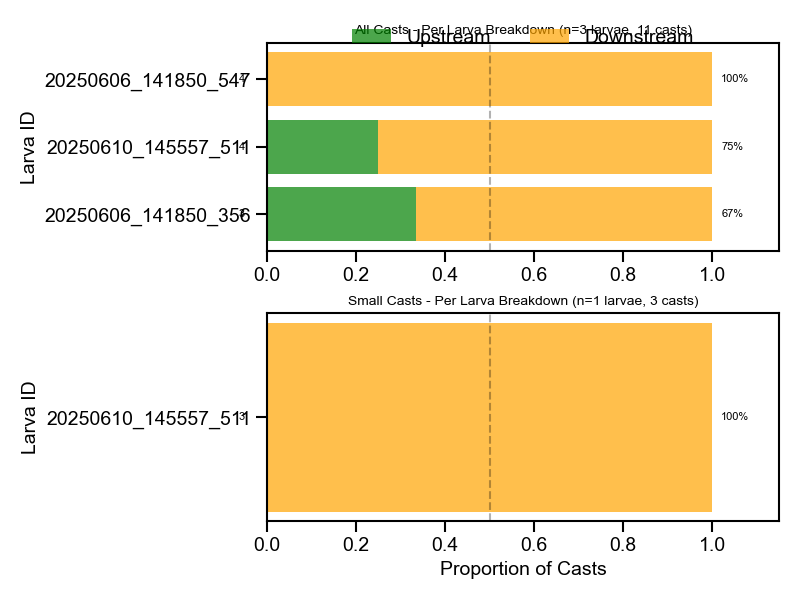


Summary of Cast Direction Analysis:
Analyzed 3 larvae with cast events during perpendicular orientation (±3°)

All Casts:
  Total: 27 casts from 3 larvae
  Upstream: 11 (40.7%), Downstream: 16 (59.3%)
  Upstream mean: 0.194 ± 0.142 (std)
  Downstream mean: 0.806 ± 0.142 (std)
  Upstream median: 0.250
  Downstream median: 0.750
  Chi-Square Test: χ² = 0.93, p = 0.3359 (not significant)
  Paired T-Test: t = -3.05, p = 0.0927 (not significant)

Small Casts:
  Total: 11 casts from 1 larvae
  Upstream: 3 (27.3%), Downstream: 8 (72.7%)
  Upstream mean: 0.000 ± 0.000 (std)
  Downstream mean: 1.000 ± 0.000 (std)
  Upstream median: 0.000
  Downstream median: 1.000
  Chi-Square Test: χ² = 2.27, p = 0.1317 (not significant)
Analyzing Experimental...


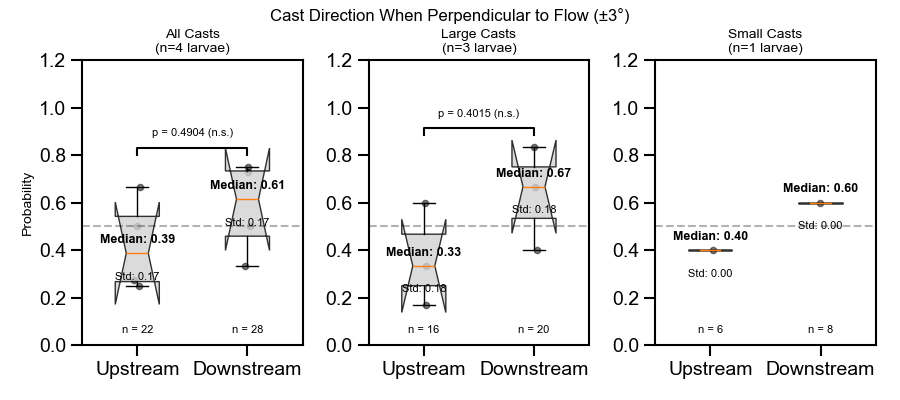

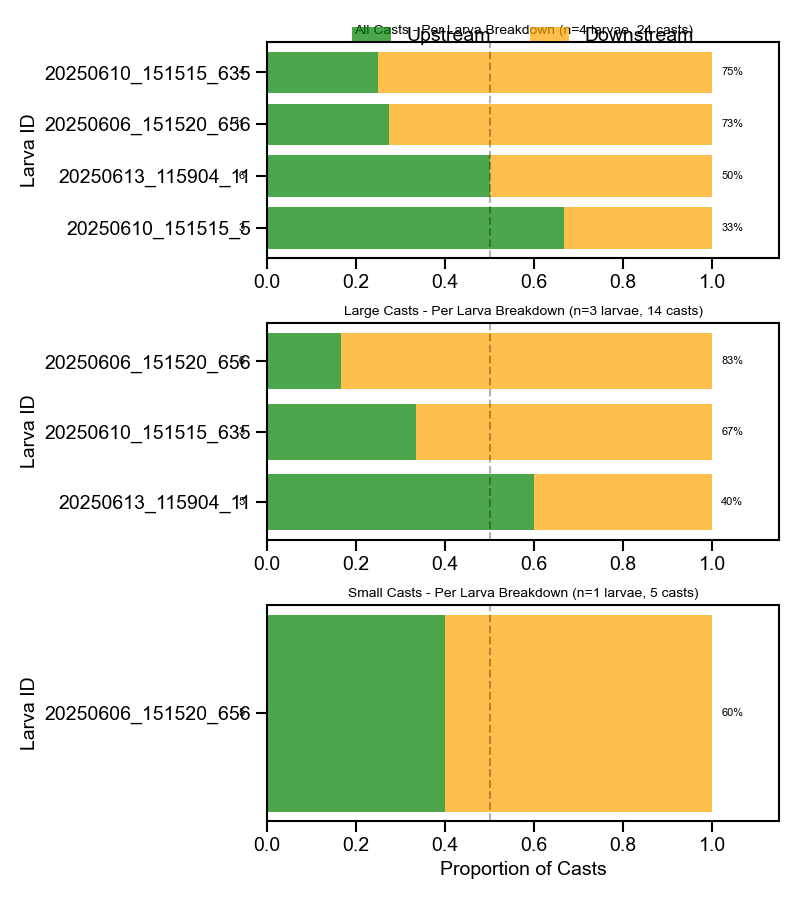


Summary of Cast Direction Analysis:
Analyzed 4 larvae with cast events during perpendicular orientation (±3°)

All Casts:
  Total: 50 casts from 4 larvae
  Upstream: 22 (44.0%), Downstream: 28 (56.0%)
  Upstream mean: 0.422 ± 0.172 (std)
  Downstream mean: 0.578 ± 0.172 (std)
  Upstream median: 0.386
  Downstream median: 0.614
  Chi-Square Test: χ² = 0.72, p = 0.3961 (not significant)
  Paired T-Test: t = -0.78, p = 0.4904 (not significant)

Large Casts:
  Total: 36 casts from 3 larvae
  Upstream: 16 (44.4%), Downstream: 20 (55.6%)
  Upstream mean: 0.367 ± 0.178 (std)
  Downstream mean: 0.633 ± 0.178 (std)
  Upstream median: 0.333
  Downstream median: 0.667
  Chi-Square Test: χ² = 0.44, p = 0.5050 (not significant)
  Paired T-Test: t = -1.06, p = 0.4015 (not significant)

Small Casts:
  Total: 14 casts from 1 larvae
  Upstream: 6 (42.9%), Downstream: 8 (57.1%)
  Upstream mean: 0.400 ± 0.000 (std)
  Downstream mean: 0.600 ± 0.000 (std)
  Upstream median: 0.400
  Downstream median: 0.60

/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: divide by zero encountered in divide
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero
/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1214: RuntimeWarning: invalid value encountered in scalar multiply
  var *= np.divide(n, n-ddof)  # to avoid error on division by zero


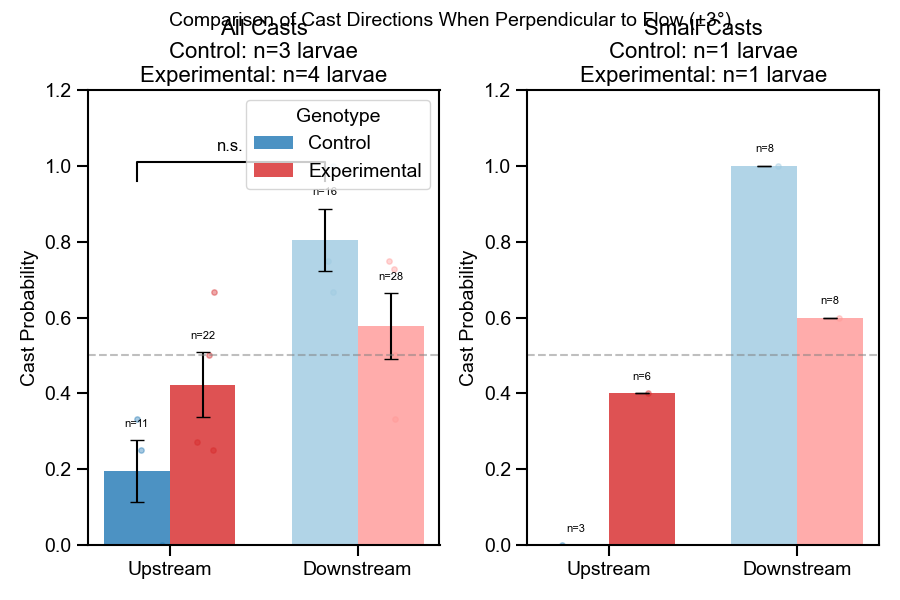

Saved statistical results to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_direction_stats_Control_vs_Experimental_20250625_140623.txt


In [ ]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_directions_perpendicular(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    angle_width=3,
    min_frame=3,
    basepath=basepath
)

In [ ]:
# # Or let the function pick a random larva with good data
# results = trx_processor.analyze_cast_head_dynamics(filtered_all_data)


# # Print the statistics
# print(f"Analysis for larva {results['larva_id']}:")
# print(f"Number of cast events: {results['n_events']}")
# print(f"Mean cast duration: {results['mean_duration']:.3f}s")
# print(f"Mean max downer-upper angle: {results['mean_max_angle_du']:.2f} degrees")
# print(f"Mean max bend angle: {results['mean_max_bend_angle']:.2f} degrees")
# print(f"Mean bend amplitude during casts: {results['mean_bend_amplitude']:.2f} degrees")

In [ ]:
# # Import libraries
# import numpy as np
# import matplotlib.pyplot as plt
# from src import trx_processor

# # Apply the analysis function
# results = trx_processor.analyze_perpendicular_cast_directions(filtered_all_data, angle_width=45)

# # Print summary statistics
# print(f"Analysis completed for {results['larvae_processed']} larvae")
# print(f"Total casts analyzed: {sum(results['total_counts'].values())}")

# # Print probabilities
# print("\nCast Direction Probabilities:")
# print(f"  Upstream: {results['probabilities']['upstream']:.3f} ({results['total_counts']['upstream']} casts)")
# print(f"  Downstream: {results['probabilities']['downstream']:.3f} ({results['total_counts']['downstream']} casts)")

# # Print statistical results
# chi2, p_chi2 = results['chi2_result']
# significance = "*" * sum([p_chi2 < threshold for threshold in [0.05, 0.01, 0.001]])
# print(f"\nChi-square test results:")
# print(f"  chi2: {chi2:.4f}")
# print(f"  p-value: {p_chi2:.4f} {significance}")

# # Add t-test results if available
# if results['ttest_result'] is not None:
#     t_stat, p_val = results['ttest_result']
#     significance = "*" * sum([p_val < threshold for threshold in [0.05, 0.01, 0.001]])
#     print(f"\nPaired t-test results:")
#     print(f"  t-statistic: {t_stat:.4f}")
#     print(f"  p-value: {p_val:.4f} {significance}")

interactive(children=(IntSlider(value=0, description='Time Frame:', layout=Layout(width='100%'), max=226), Out…

{'time': array([ 0.236,  0.286,  0.346,  0.403,  0.457,  0.523,  0.572,  0.638,
         0.711,  0.765,  0.823,  0.878,  0.951,  1.019,  1.073,  1.129,
         1.185,  1.236,  1.303,  1.352,  1.436,  1.515,  1.593,  1.683,
         1.766,  1.853,  1.935,  2.02 ,  2.108,  2.187,  2.267,  2.353,
         2.439,  2.523,  2.605,  2.689,  2.773,  2.858,  2.934,  3.025,
         3.108,  3.191,  3.276,  3.354,  3.444,  3.527,  3.611,  3.695,
         3.778,  3.862,  3.946,  4.029,  4.115,  4.198,  4.28 ,  4.364,
         4.448,  4.531,  4.616,  4.694,  4.783,  4.867,  4.95 ,  5.035,
         5.13 ,  5.203,  5.287,  5.37 ,  5.453,  5.538,  5.622,  5.716,
         5.789,  5.873,  5.958,  6.041,  6.126,  6.21 ,  6.292,  6.376,
         6.453,  6.546,  6.627,  6.71 ,  6.794,  6.872,  6.965,  7.046,
         7.134,  7.212,  7.296,  7.38 ,  7.465,  7.548,  7.632,  7.716,
         7.799,  7.883,  7.969,  8.053,  8.134,  8.213,  8.305,  8.386,
         8.468,  8.553,  8.631,  8.721,  8.806,  8.888, 

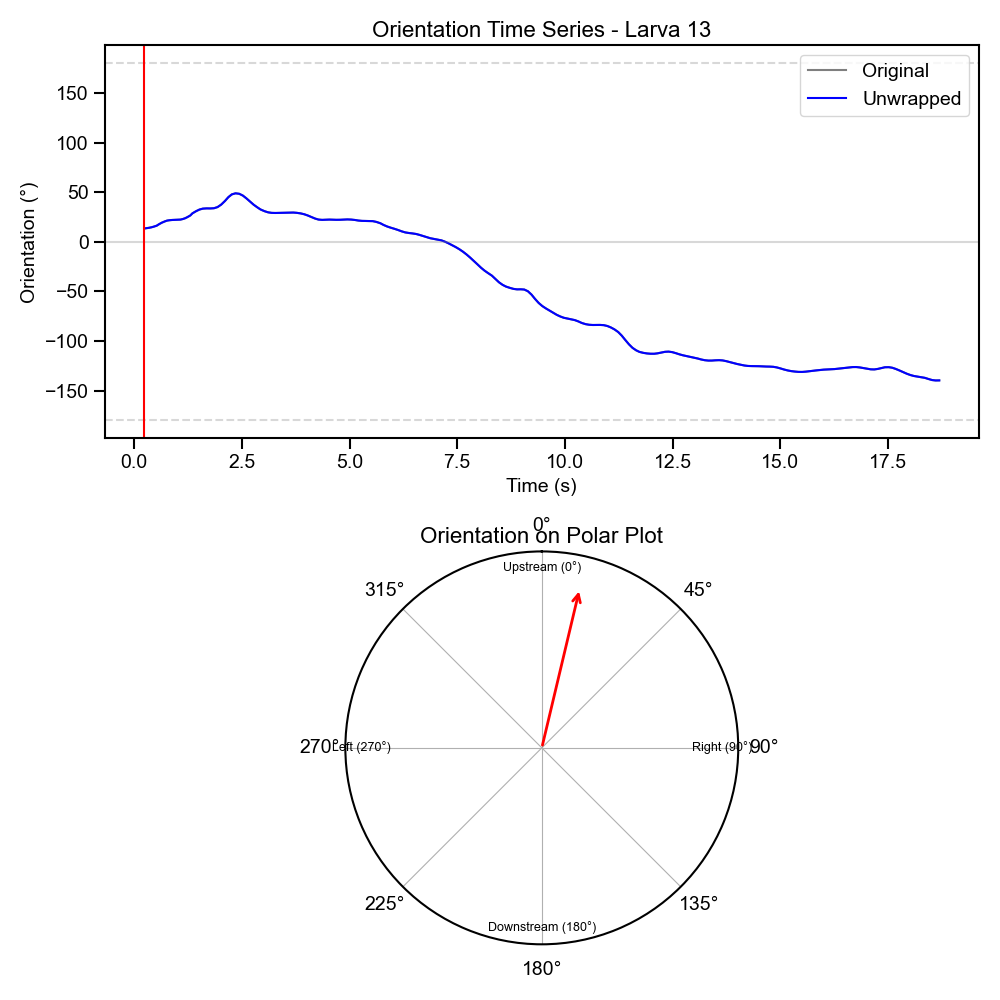

In [ ]:
processor.plot_angle_timeseries_with_polar(filtered_extracted_data, larva_id=first_larva, smooth_window=5, jump_threshold=20)

/Users/sharbat/Projects/anemotaxis/src/processor.py:11880: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(['0°\n(Downstream)', '45°', '90°\n(Right)', '135°',
/Users/sharbat/Projects/anemotaxis/src/processor.py:11903: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(['0°\n(No Bend)', '45°\n(Right)', '90°\n(Right)', '135°\n(Right)',
/Users/sharbat/Projects/anemotaxis/src/processor.py:11937: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


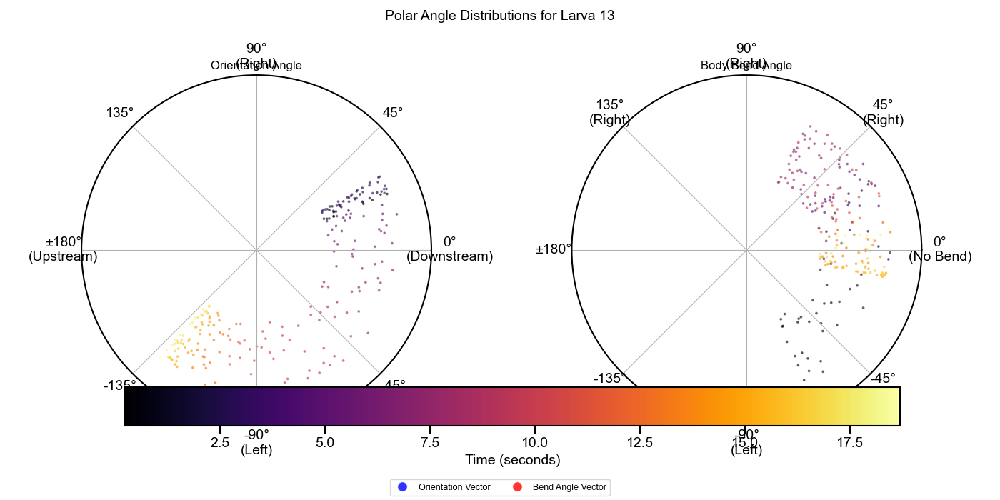

In [ ]:
# For coloring by time with a cool colormap
results = processor.plot_polar_angles_scatter(
    filtered_extracted_data,
    larva_id=first_larva,
    smooth_window=50,
    jump_threshold=20,
    cmap='inferno'  # Try other colormaps: viridis, inferno, magma, cividis
)

# Or to visualize behavior states
# results_behavior = trx_processor.plot_polar_angles_scatter(
#     filtered_extracted_data,
#     larva_id=first_larva,
#     smooth_window=50,
#     jump_threshold=20,
#     color_by='behavior'
# )

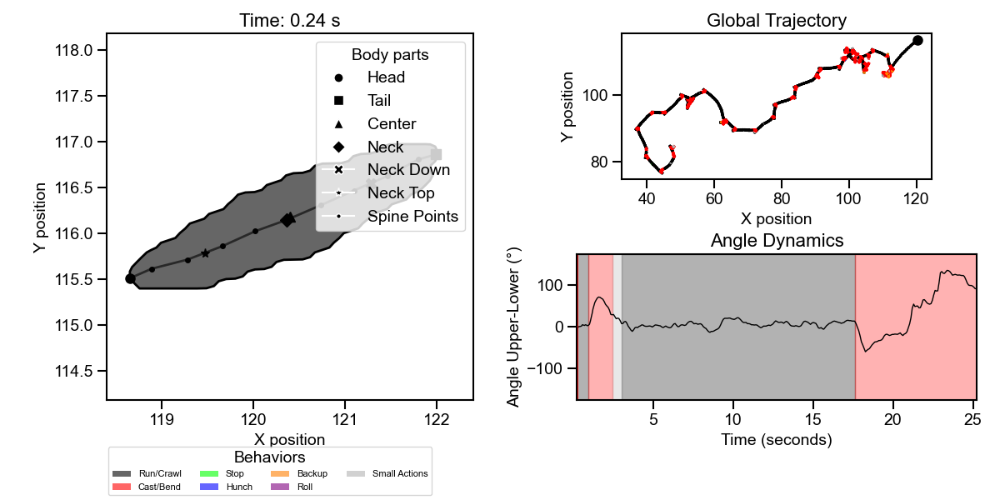

In [ ]:
first_larva = sorted(filtered_extracted_data.keys())[3]
processor.plot_behavioral_contour_with_global_trajectory(filtered_extracted_data, first_larva)

/Users/sharbat/Projects/anemotaxis/src/processor.py:6701: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(['0°\n(Downstream)', '45°', '90°\n(Right)', '135°', '±180°\n(Upstream)', '-135','-90°\n(Left)', '-45°'])


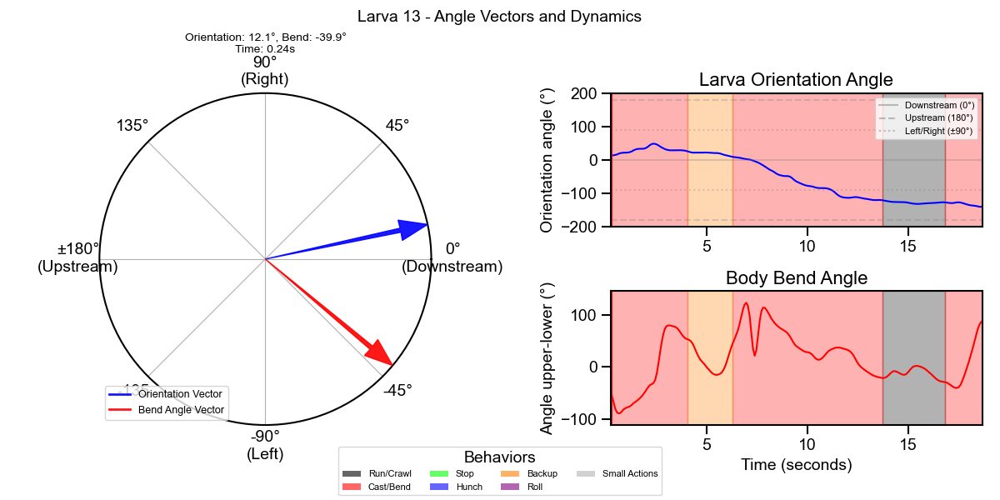

{'larva_id': 13,
 'time': array([ 0.236,  0.286,  0.346,  0.403,  0.457,  0.523,  0.572,  0.638,
         0.711,  0.765,  0.823,  0.878,  0.951,  1.019,  1.073,  1.129,
         1.185,  1.236,  1.303,  1.352,  1.436,  1.515,  1.593,  1.683,
         1.766,  1.853,  1.935,  2.02 ,  2.108,  2.187,  2.267,  2.353,
         2.439,  2.523,  2.605,  2.689,  2.773,  2.858,  2.934,  3.025,
         3.108,  3.191,  3.276,  3.354,  3.444,  3.527,  3.611,  3.695,
         3.778,  3.862,  3.946,  4.029,  4.115,  4.198,  4.28 ,  4.364,
         4.448,  4.531,  4.616,  4.694,  4.783,  4.867,  4.95 ,  5.035,
         5.13 ,  5.203,  5.287,  5.37 ,  5.453,  5.538,  5.622,  5.716,
         5.789,  5.873,  5.958,  6.041,  6.126,  6.21 ,  6.292,  6.376,
         6.453,  6.546,  6.627,  6.71 ,  6.794,  6.872,  6.965,  7.046,
         7.134,  7.212,  7.296,  7.38 ,  7.465,  7.548,  7.632,  7.716,
         7.799,  7.883,  7.969,  8.053,  8.134,  8.213,  8.305,  8.386,
         8.468,  8.553,  8.631,  8.721,

In [ ]:
first_larva = sorted(filtered_extracted_data.keys())[0]
processor.plot_larva_angle_vectors(filtered_extracted_data, larva_id=first_larva, smooth_window=5, time_window=50)


/Users/sharbat/Projects/anemotaxis/src/processor.py:7165: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_polar.set_xticklabels(['90°\n(R)', '45°', '0°\n(D)', '315°', '270°\n(L)', '225°', '180°\n(U)', '135°'],


/Users/sharbat/Projects/anemotaxis/src/processor.py:7472: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


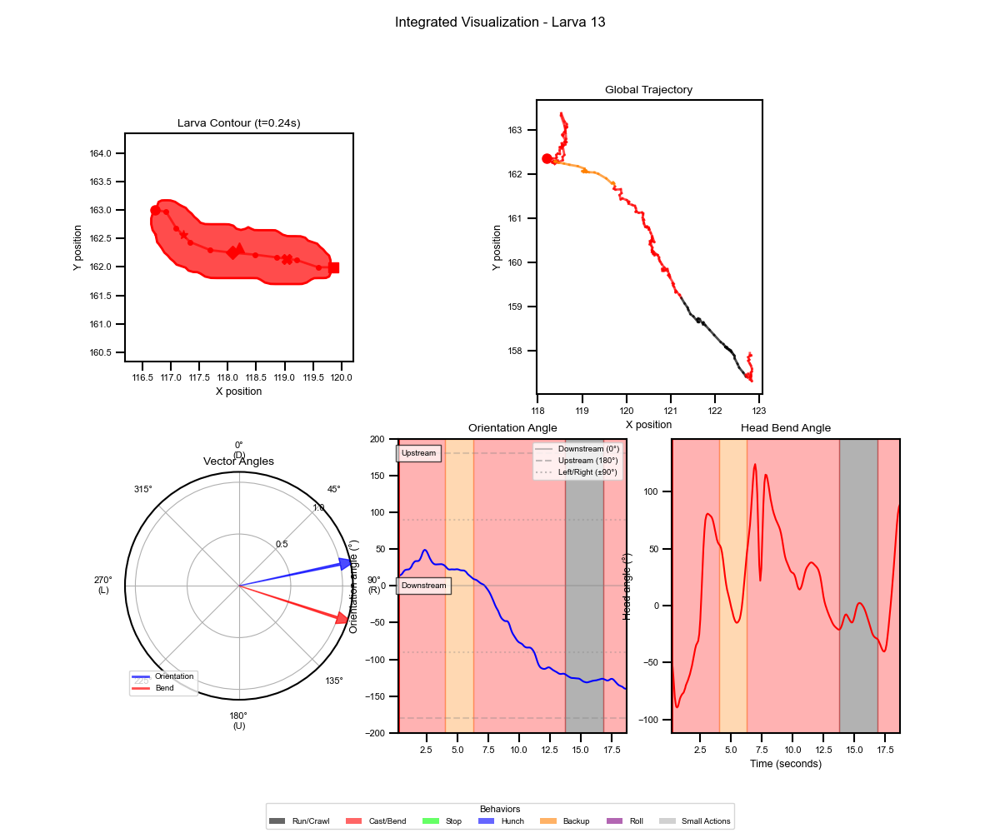

{'larva_id': 13,
 'time': array([ 0.236,  0.286,  0.346,  0.403,  0.457,  0.523,  0.572,  0.638,
         0.711,  0.765,  0.823,  0.878,  0.951,  1.019,  1.073,  1.129,
         1.185,  1.236,  1.303,  1.352,  1.436,  1.515,  1.593,  1.683,
         1.766,  1.853,  1.935,  2.02 ,  2.108,  2.187,  2.267,  2.353,
         2.439,  2.523,  2.605,  2.689,  2.773,  2.858,  2.934,  3.025,
         3.108,  3.191,  3.276,  3.354,  3.444,  3.527,  3.611,  3.695,
         3.778,  3.862,  3.946,  4.029,  4.115,  4.198,  4.28 ,  4.364,
         4.448,  4.531,  4.616,  4.694,  4.783,  4.867,  4.95 ,  5.035,
         5.13 ,  5.203,  5.287,  5.37 ,  5.453,  5.538,  5.622,  5.716,
         5.789,  5.873,  5.958,  6.041,  6.126,  6.21 ,  6.292,  6.376,
         6.453,  6.546,  6.627,  6.71 ,  6.794,  6.872,  6.965,  7.046,
         7.134,  7.212,  7.296,  7.38 ,  7.465,  7.548,  7.632,  7.716,
         7.799,  7.883,  7.969,  8.053,  8.134,  8.213,  8.305,  8.386,
         8.468,  8.553,  8.631,  8.721,

In [ ]:
first_larva = sorted(filtered_extracted_data.keys())[0]
processor.plot_larva_integrated_visualization(filtered_extracted_data, larva_id=first_larva, smooth_window=5, time_window=50)
